In [1]:
import functions as fct
import importlib
from datetime import datetime
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import folium
from folium.features import DivIcon
from obspy.clients.fdsn import Client


In [2]:
importlib.reload(fct)

<module 'functions' from 'C:\\Users\\User\\Documents\\Cours\\Stage\\functions.py'>

In [3]:
psd_p_19 , dates_p_19, freqs_p_19 = fct.load_psd("PSD_PII_2019-1-1_2019-12-31_RR.npz")
psd_p_24 , dates_p_24, freqs_p_24 = fct.load_psd("PSD_PII_2024-1-1_2024-12-31_RR.npz")

# METADONNEES SISMOLOGIQUES

In [4]:
lat_virgo = 43.63
lg_virgo = 10.5
client = Client("INGV")
inventory = client.get_stations(latitude=lat_virgo, longitude=lg_virgo, minradius=0, maxradius=0.1, level="channel")
print(inventory)

Inventory created at 2026-08-24T18:19:32.764000Z
	Created by: INGV-ONT WEB SERVICE: fdsnws-station | version: 1.1.64
		    /exist/apps/fdsn-station/fdsnws/station/1/query?level=channel&latit...
	Sending institution: eXistDB (INGV-ONT)
	Contains:
		Networks (2):
			IV, VR
		Stations (4):
			IV.PII (PISA)
			VR.VRG01 (Virgo Central Building)
			VR.VRG02 (Virgo North End Building)
			VR.VRG03 (Virgo West End Building)
		Channels (17):
			IV.PII..HHZ (2x), IV.PII..HHN (2x), IV.PII..HHE (2x), 
			IV.PII..SHZ (2x), VR.VRG01..HH1, VR.VRG01..HH2, VR.VRG01..HH3, 
			VR.VRG02..HH1, VR.VRG02..HH2, VR.VRG02..HH3, VR.VRG03..HH1, 
			VR.VRG03..HH2, VR.VRG03..HH3


In [5]:
stations_map = folium.Map(location=[lat_virgo,lg_virgo], zoom_start=11)
for network in inventory.networks:
    for station in network.stations:
        folium.Marker(location=[station.latitude, station.longitude], tooltip=f"{network.code}.{station.code}").add_to(stations_map)


stations_map = folium.Map(
    location=[lat_virgo+0.04, lg_virgo],
    zoom_start=12    ,control_scale=True

)

for network in inventory.networks:
    for station in network.stations:

        label = f"{network.code}.{station.code}"
        folium.Marker(location=[station.latitude, station.longitude], tooltip=f"{network.code}.{station.code}").add_to(stations_map)

        folium.Marker(
            location=[station.latitude, station.longitude-0.01],
            icon=DivIcon(
                icon_size=(150, 36),
                icon_anchor=(0, 0),
                html=f"""
                <div style="
                    font-size: 15px;
                    font-weight: bold;
                    color: black;
                    white-space: nowrap;
                ">
                    {label}
                </div>
                """
            )
        ).add_to(stations_map)


stations_map


# COMPARAISON VRG01 vs PII

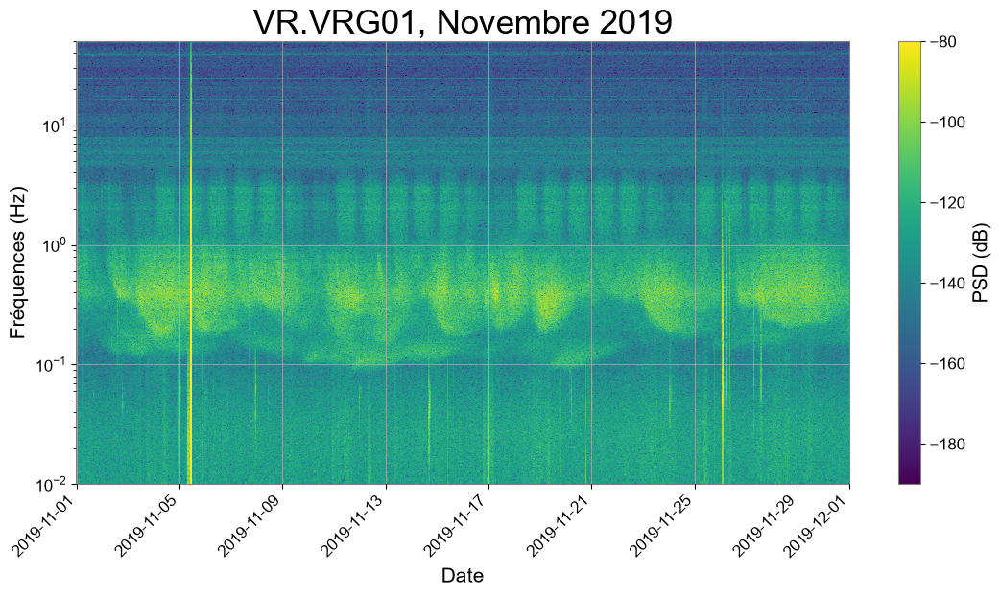

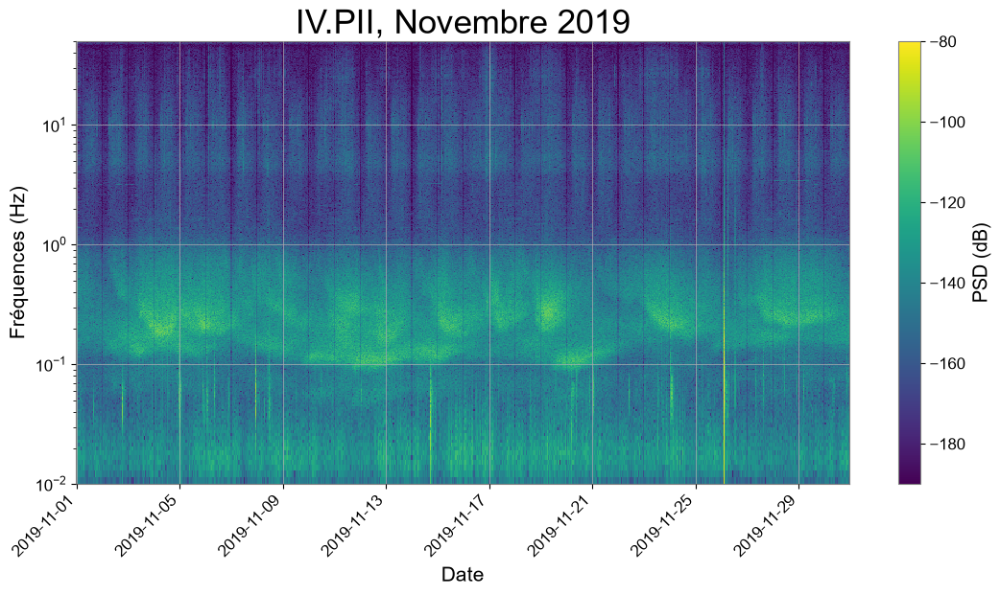

In [6]:
psd_19 , dates_19, freqs_19 = fct.load_psd("PSD_VRG01_2019.npz")
fct.spec_plot(psd_19 , dates_19, freqs_19, title = "VR.VRG01, Novembre 2019",limx=(datetime(2019,11,1),datetime(2019,12,1)),outfile="spec_vrg")

fct.spec_plot(psd_p_19 , dates_p_19, freqs_p_19, title = "IV.PII, Novembre 2019",limx=(datetime(2019,11,1),datetime(2019,12,1)),outfile="spec_pii")

# ANALYSE PAR RUN

In [7]:
data = pd.read_pickle("data_V1.pkl")


In [8]:
start_O2 = datetime(2016,11,30)
end_O2 = datetime(2017,8,25)

mask_O2 = (data["date"] >= start_O2) & (data["date"] <= end_O2)
O2_data = data[mask_O2]

start_O3a = datetime(2019,4,1)
end_O3a = datetime(2019,10,1)

mask_O3a = (data["date"] >= start_O3a) & (data["date"] <= end_O3a)
O3a_data = data[mask_O3a]

start_O3b = datetime(2019,11,11)
end_O3b = datetime(2020,3,27)

mask_O3b = (data["date"] >= start_O3b) & (data["date"] <= end_O3b)
O3b_data = data[mask_O3b]

start_O4a = pd.Timestamp(2023,5,24)
end_O4a = pd.Timestamp(2024,1,16)

mask_O4a = (data["date"] >= start_O4a) & (data["date"] <= end_O4a)

O4a_data = data[mask_O4a]

start_O4b = pd.Timestamp("2024-04-10")
end_O4b = pd.Timestamp("2025-01-28")

mask_O4b = (data["date"] >= start_O4b) & (data["date"] <= end_O4b)
O4b_data = data[mask_O4b]

Il y a 0 évenements pendant la journée et 0 événements pendant la nuit.


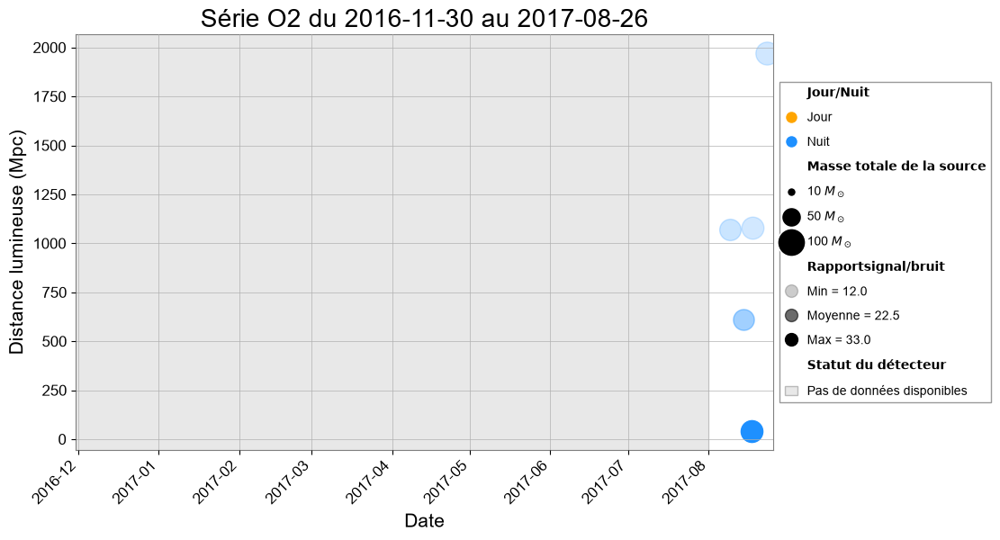

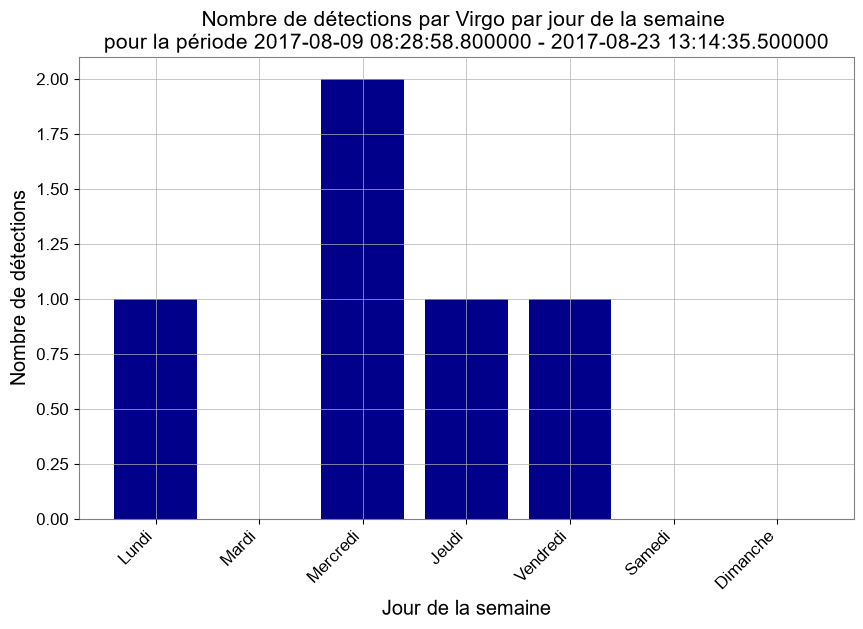

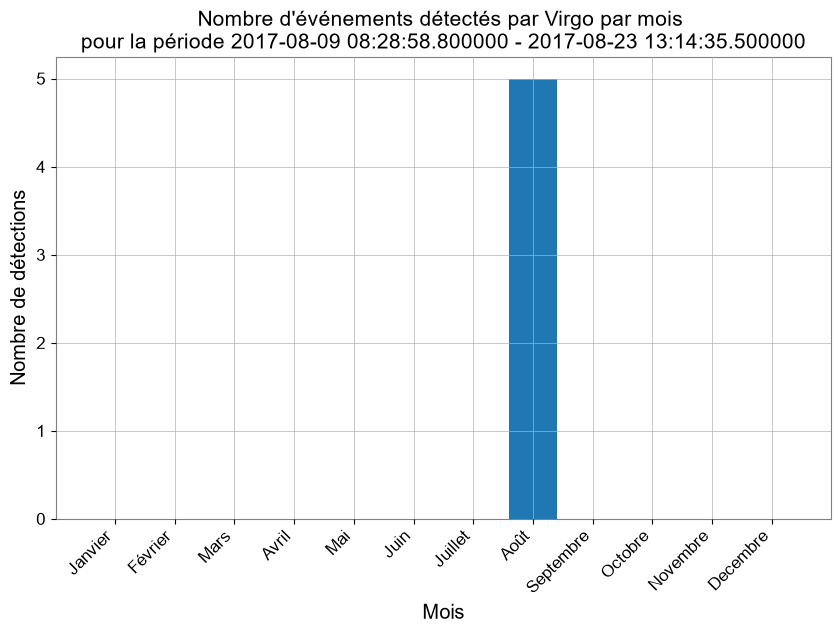

In [9]:
#O2

fct.day_night_ratio(O2_data)
fct.plot_events(O2_data,"O2",offline_periods=[(start_O2,datetime(2017,8,1))], lim = (start_O2,end_O2+ pd.Timedelta(days=1)),outfile = "O2")
fct.plot_days(O2_data)
fct.plot_months(O2_data)
#fct.plot_rate(O2_data)

Il y a 0 évenements pendant la journée et 0 événements pendant la nuit.


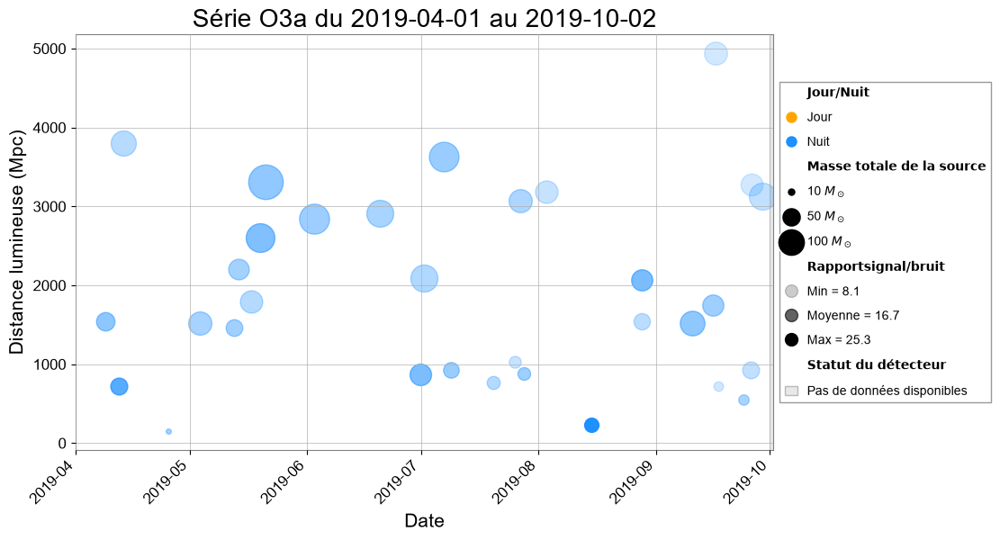

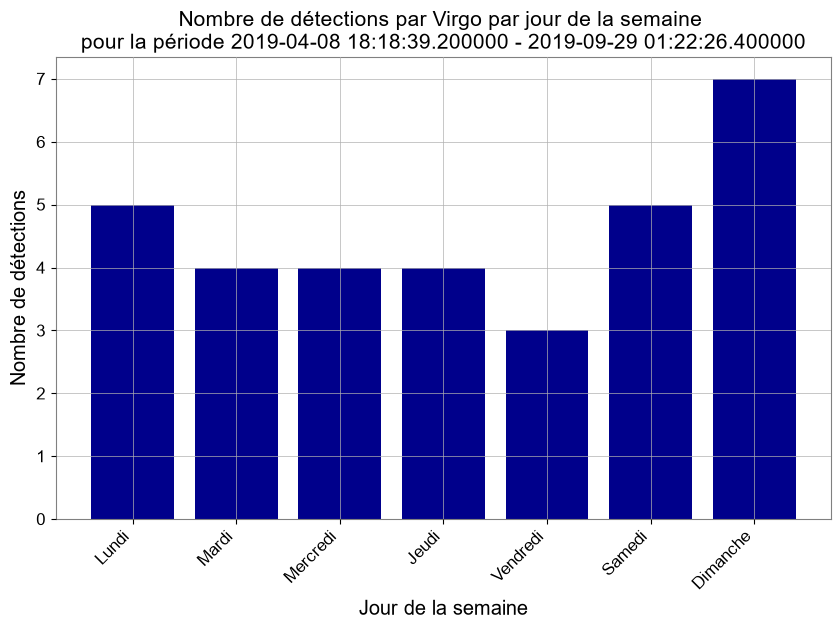

In [10]:
#O3a

fct.day_night_ratio(O3a_data)
fct.plot_events(O3a_data,"O3a",offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim = (start_O3a,end_O3a+ pd.Timedelta(days=1)),outfile = "O3a")
fct.plot_days(O3a_data)
#fct.plot_rate(O3a_data)

Il y a 0 évenements pendant la journée et 0 événements pendant la nuit.


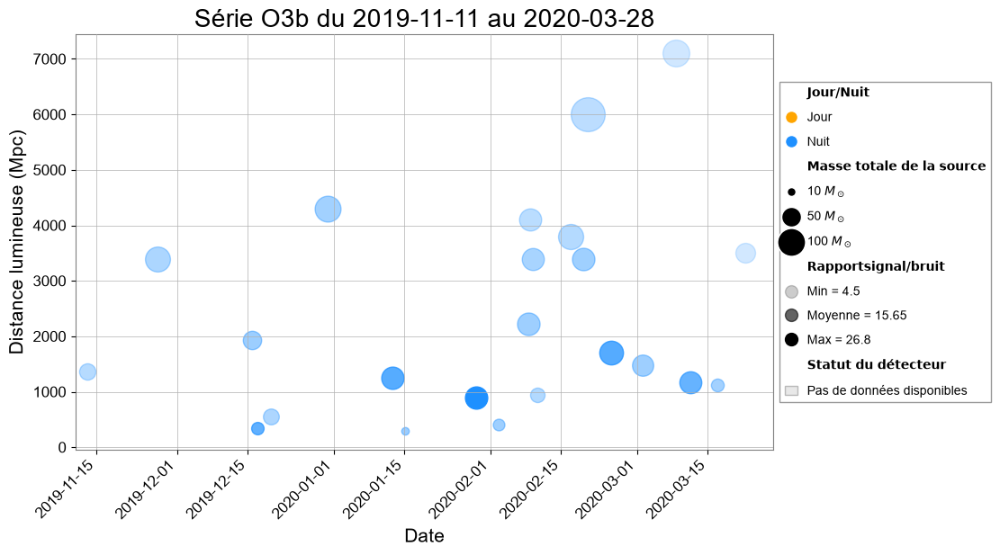

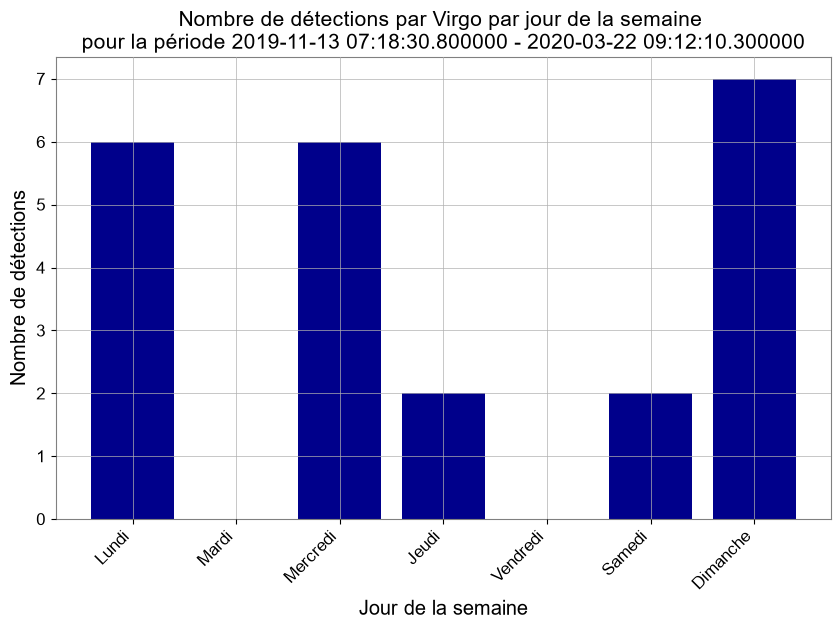

In [11]:
#O3b

fct.day_night_ratio(O3b_data)
fct.plot_events(O3b_data,"O3b",offline_periods= [(datetime(2020,3,28),datetime(2020,12,31))], lim = (start_O3b,end_O3b+ pd.Timedelta(days=1)),outfile = "O3b")
fct.plot_days(O3b_data)
#fct.plot_rate(O3b_data)

Il y a 0 évenements pendant la journée et 0 événements pendant la nuit.


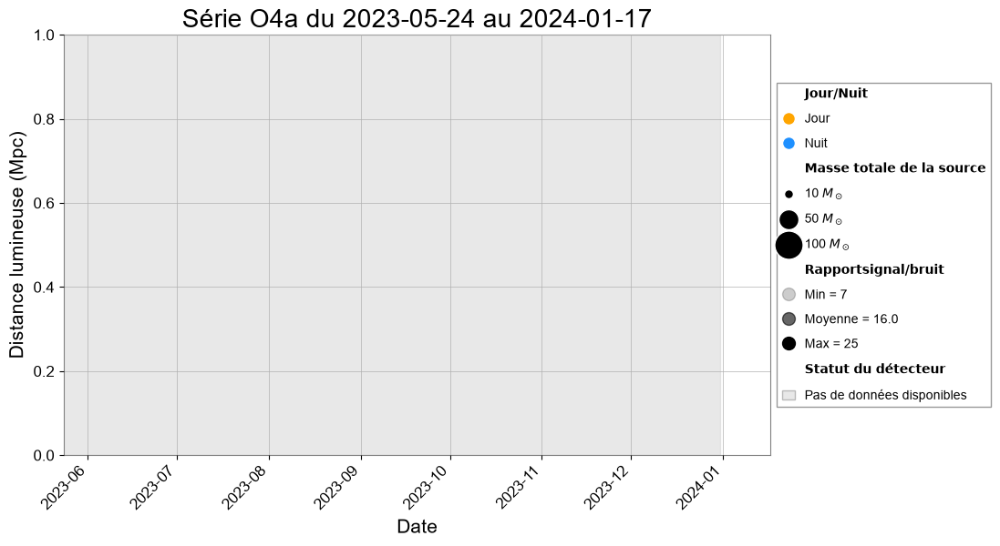

In [12]:
#O4a

fct.day_night_ratio(O4a_data)
fct.plot_events(O4a_data,"O4a",offline_periods=[(datetime(2023,1,1),datetime(2023,12,31))], lim = (start_O4a,end_O4a+ pd.Timedelta(days=1)),outfile = "O4a")


Il y a 0 évenements pendant la journée et 0 événements pendant la nuit.


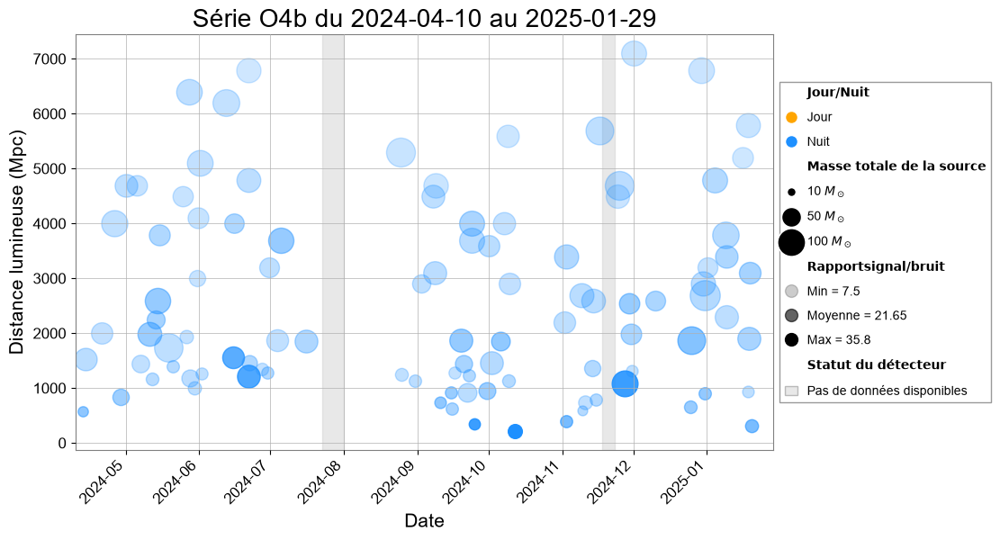

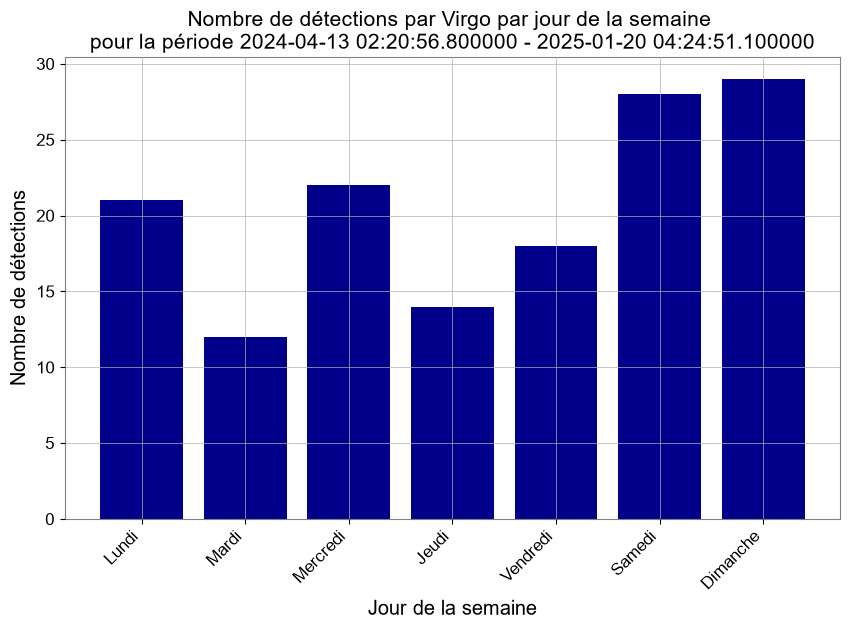

In [13]:
#O4b

fct.day_night_ratio(O4b_data)
fct.plot_events(O4b_data,"O4b",offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim = (start_O4b,end_O4b+ pd.Timedelta(days=1)),outfile = "O4b")
fct.plot_days(O4b_data)
#fct.plot_rate(O4b_data)

# ANALYSE SUR 2 MOIS

In [14]:
data = pd.read_pickle("data_V1.pkl")
data_19 = fct.select_year(data,2019)
data_20 = fct.select_year(data,2020)
data_21 = fct.select_year(data,2021)
data_22 = fct.select_year(data,2022)
data_23 = fct.select_year(data,2023)
data_24 = fct.select_year(data,2024)
data_25 = fct.select_year(data,2025)

In [15]:
psd_p_19 , dates_p_19, freqs_p_19 = fct.load_psd("PSD_PII_2019-1-1_2019-12-31_RR.npz")
psd_p_19 , dates_p_19, freqs_p_19 = fct.load_psd("PSD_PII_2019-1-1_2019-12-31_RR.npz")
psd_p_20 , dates_p_20, freqs_p_20 = fct.load_psd("PSD_PII_2020-1-1_2020-2-29_RR.npz")
psd_p_24 , dates_p_24, freqs_p_24 = fct.load_psd("PSD_PII_2024-1-1_2024-12-31_RR.npz")

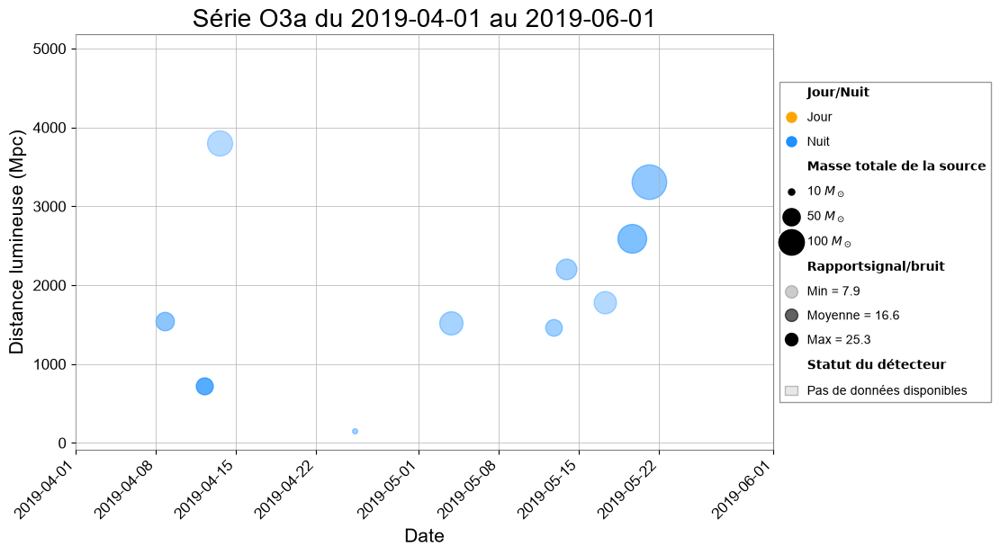

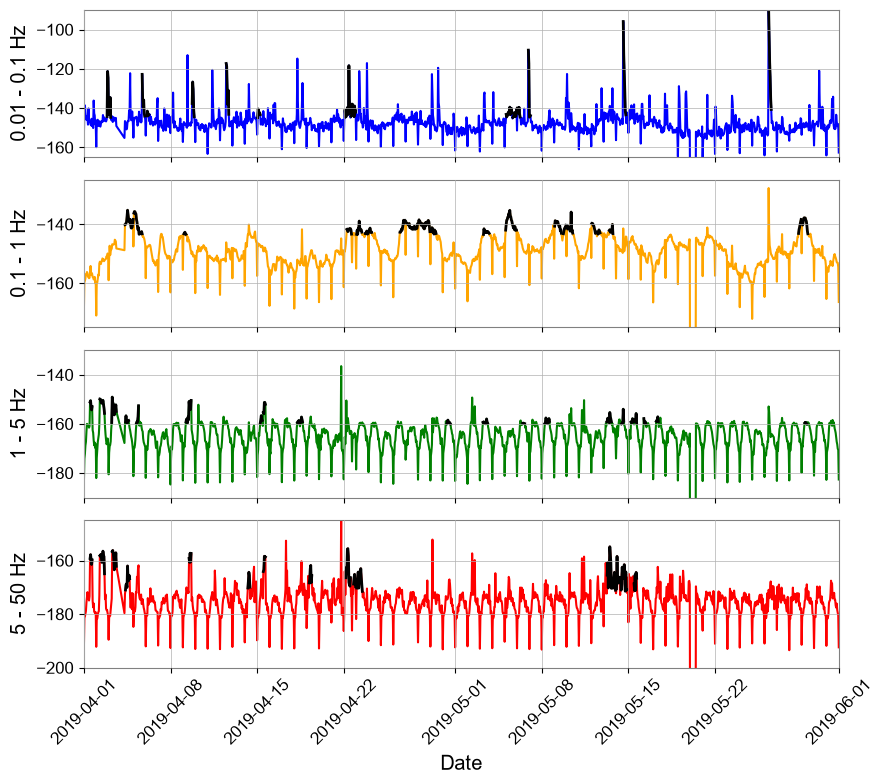

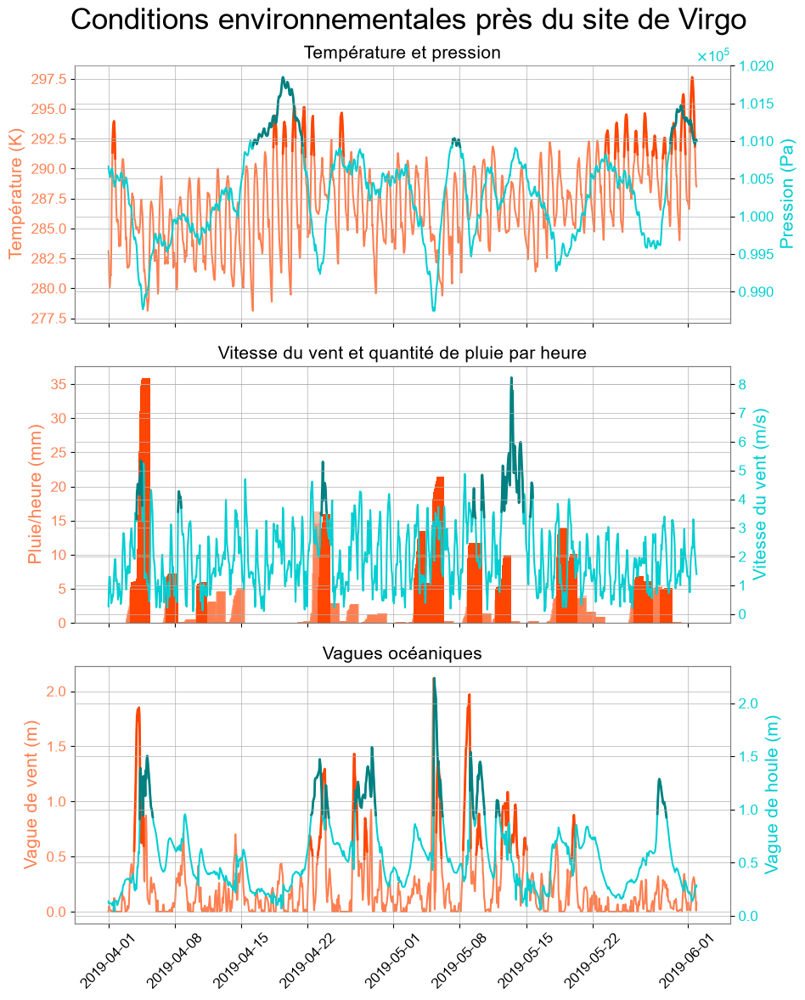

In [16]:
limx=(datetime(2019,4,1),datetime(2019,6,1))
fct.plot_events(data_19,"O3a",offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx,  we=False, eq = False)
limx = ("2019-04-01","2019-06-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

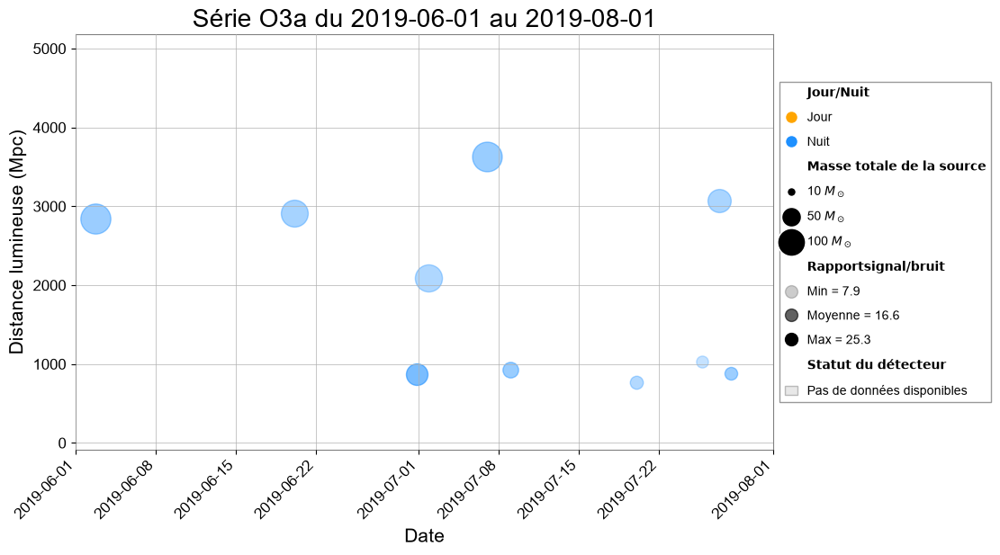

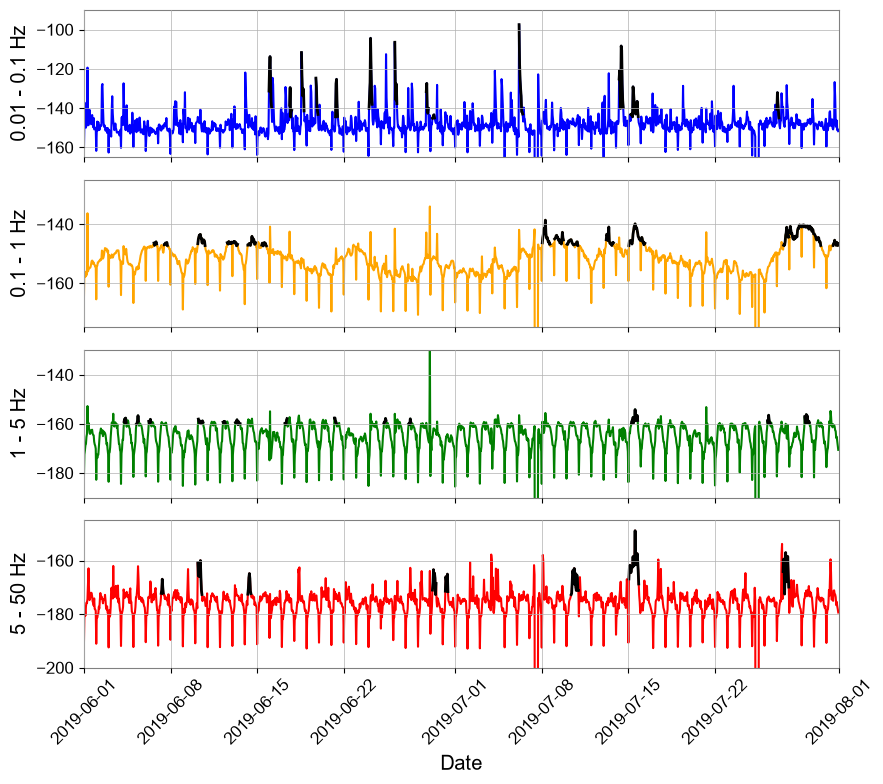

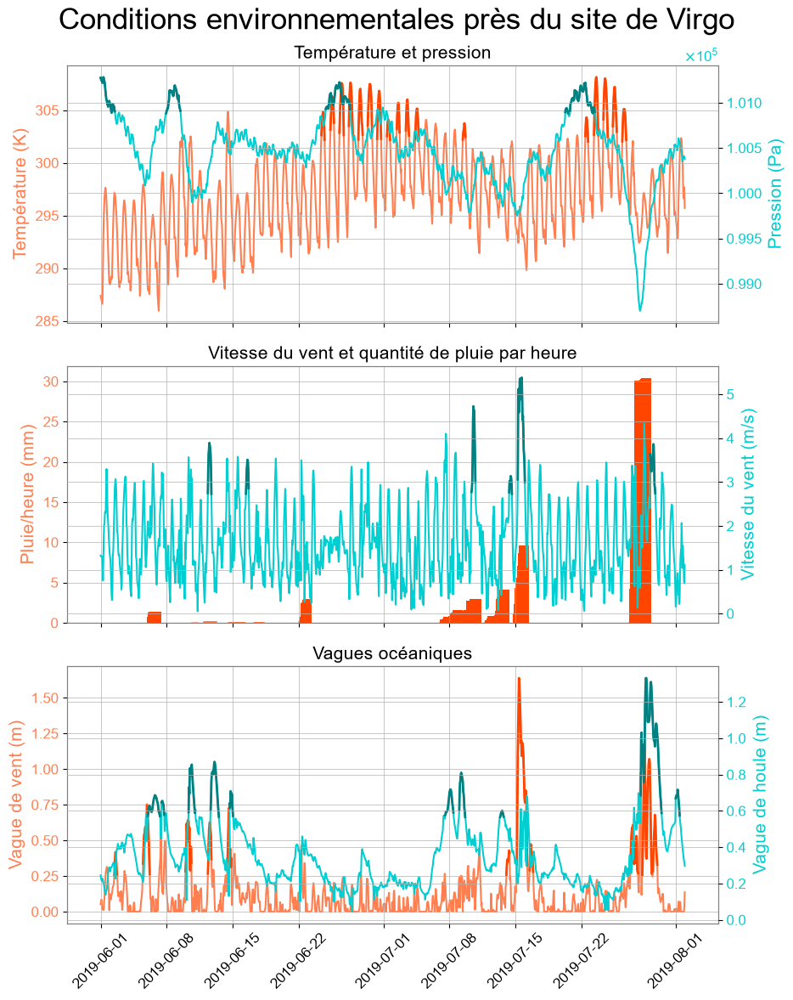

In [17]:
limx=(datetime(2019,6,1),datetime(2019,8,1))
fct.plot_events(data_19,"O3a", offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx,  we=False, eq = False)
limx = ("2019-06-01","2019-08-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

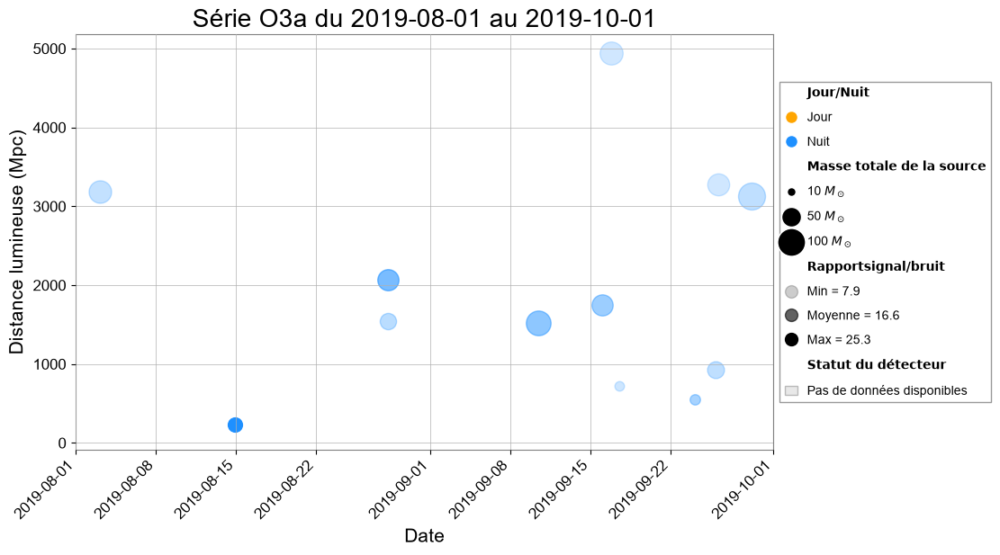

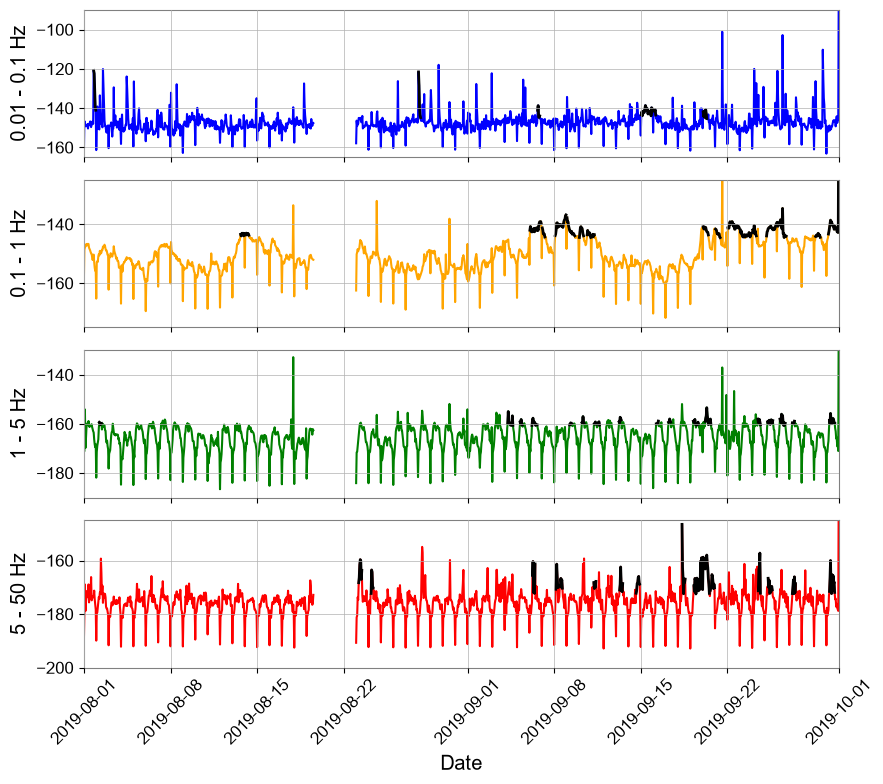

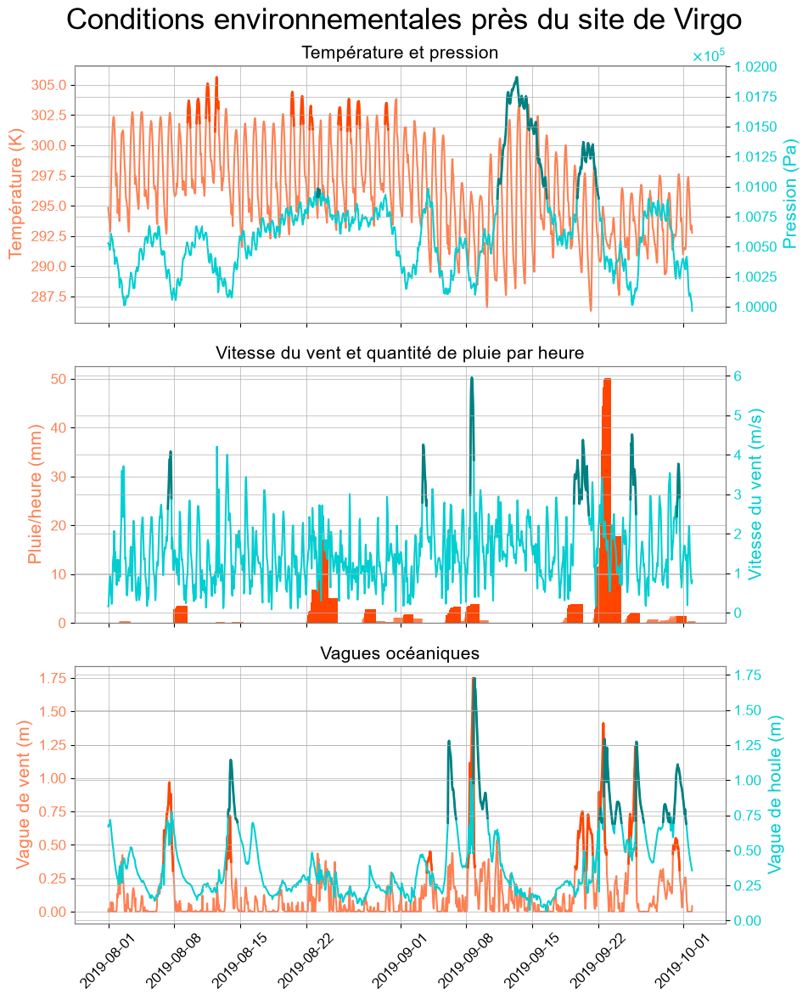

In [18]:
limx=(datetime(2019,8,1),datetime(2019,10,1))
fct.plot_events(data_19,"O3a", offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx, we=False, eq = False)
limx = ("2019-08-01","2019-10-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

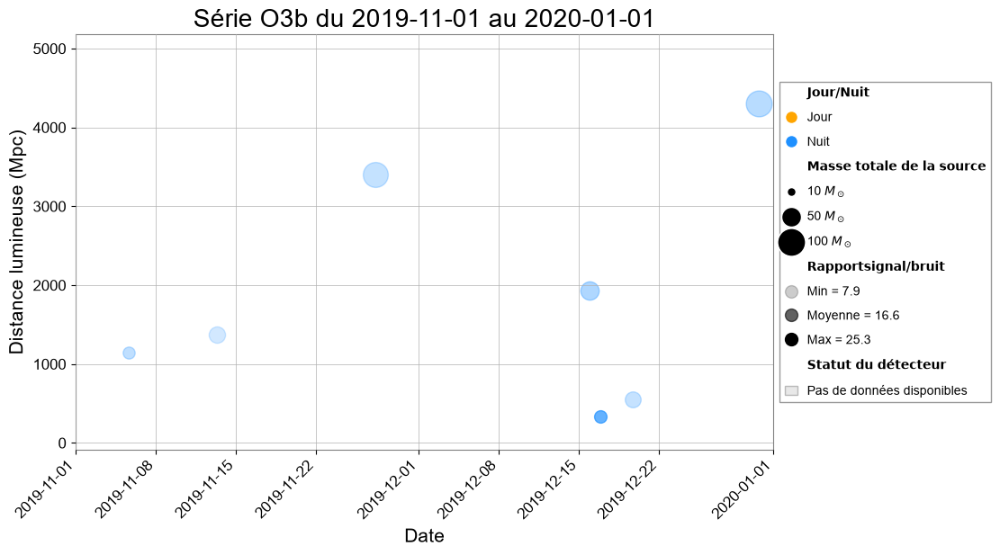

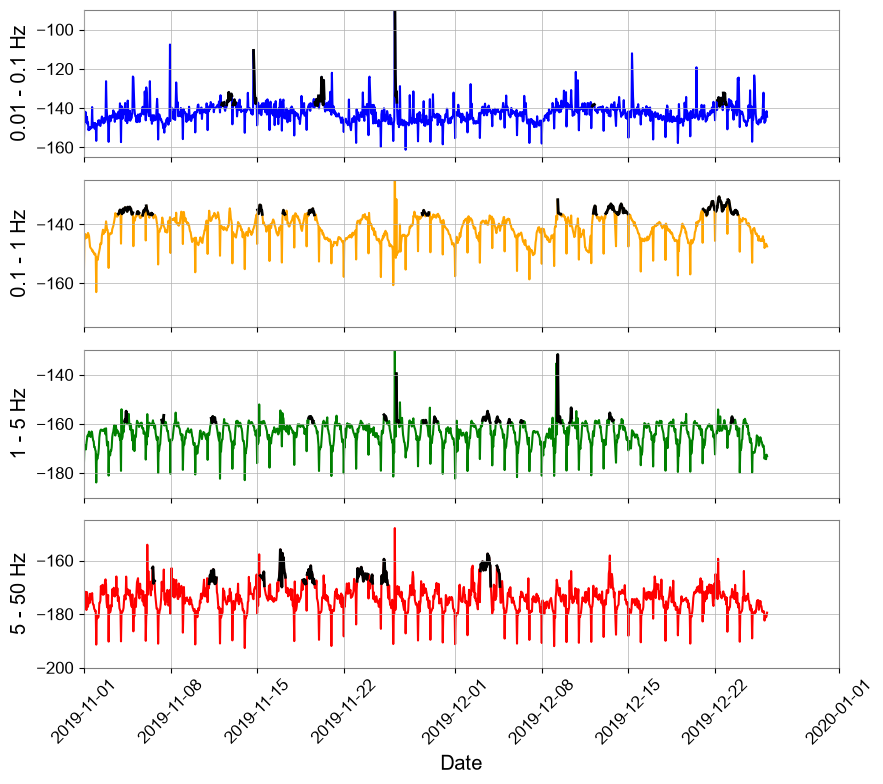

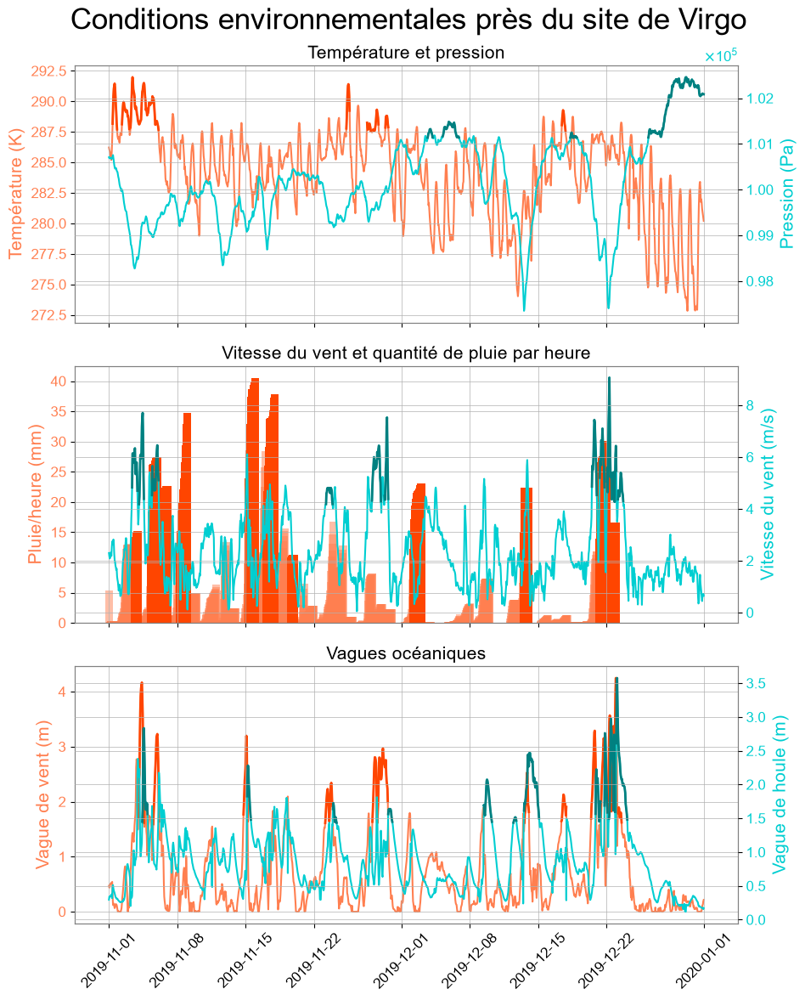

In [19]:
limx=(datetime(2019,11,1),datetime(2020,1,1))
fct.plot_events(data_19,"O3b", offline_periods=[(datetime(2019,1,1),datetime(2019,3,31)),(datetime(2019,10,1),datetime(2019,11,1))], lim =limx )
fct.median_4_bis(psd_p_19, dates_p_19, freqs_p_19,limx=limx, we=False, eq = False)
limx = ("2019-11-01","2020-01-01")
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx, p=85, n=8)

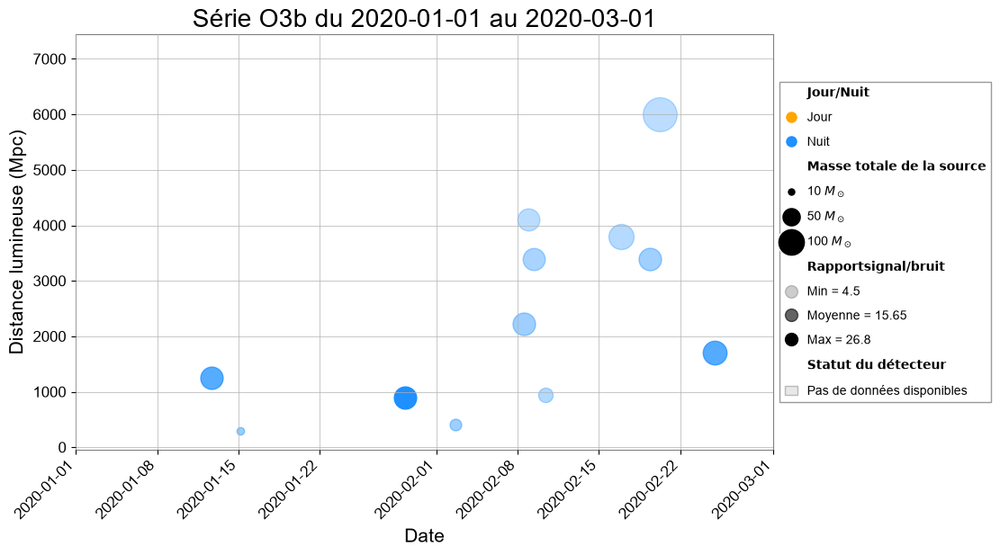

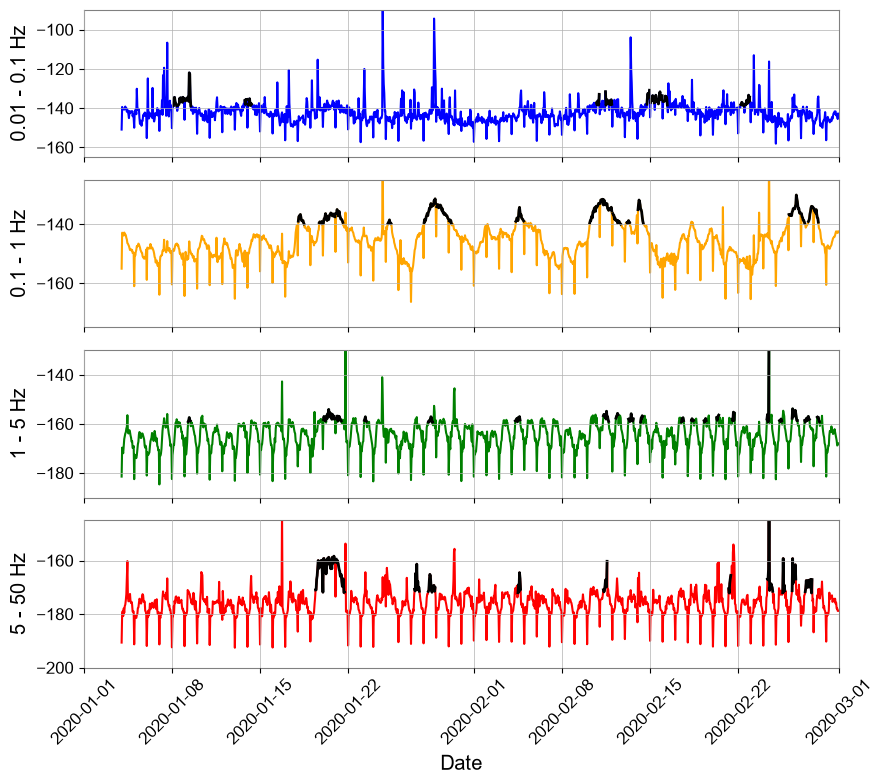

In [20]:
limx=(datetime(2020,1,1),datetime(2020,3,1))
fct.plot_events(data_20,"O3b", offline_periods=[(datetime(2020,3,28),datetime(2020,12,31))], lim =limx )
fct.median_4_bis(psd_p_20, dates_p_20, freqs_p_20,limx=limx,  we=False, eq = False)

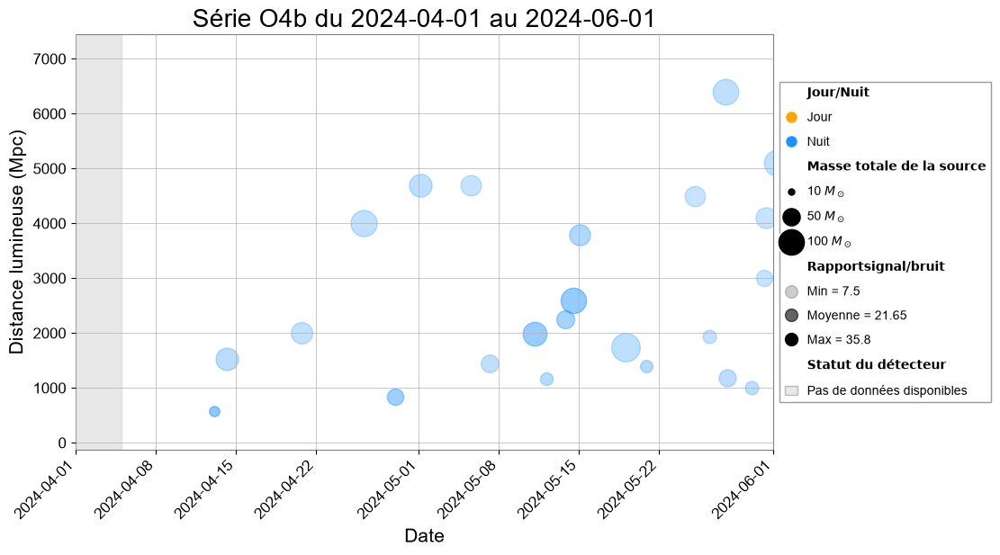

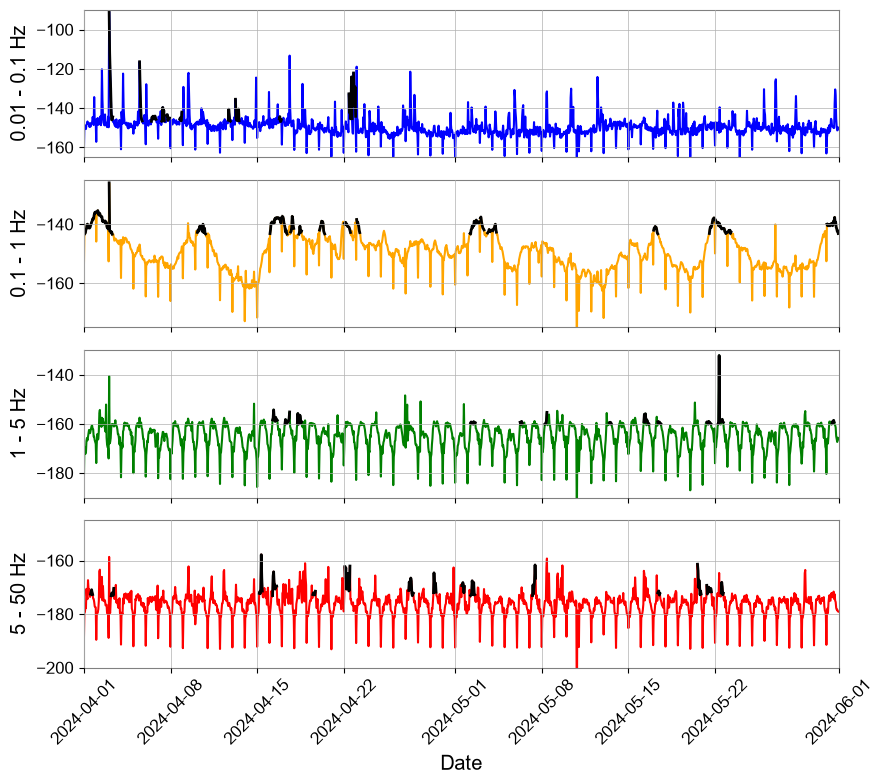

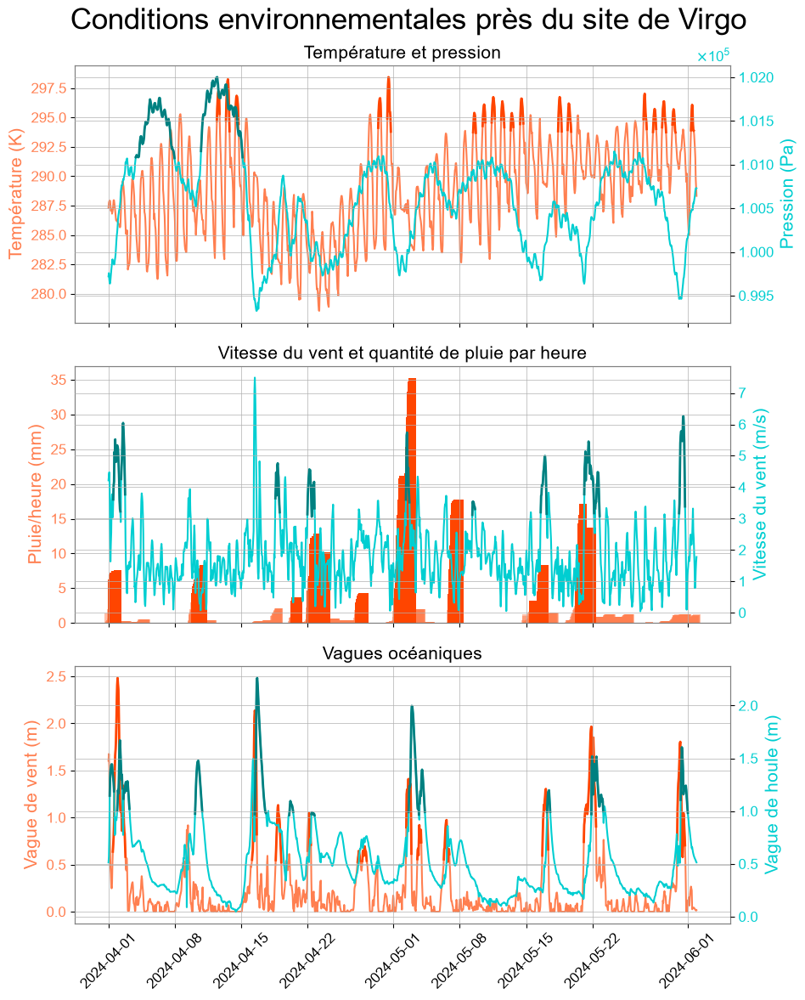

In [21]:
limx=(datetime(2024,4,1),datetime(2024,6,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx,outfile="avril_mai_24_e.png")
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx,  we=False, eq = False,outfile="avril_mai_24_s.png")
limx = ("2024-04-01","2024-06-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

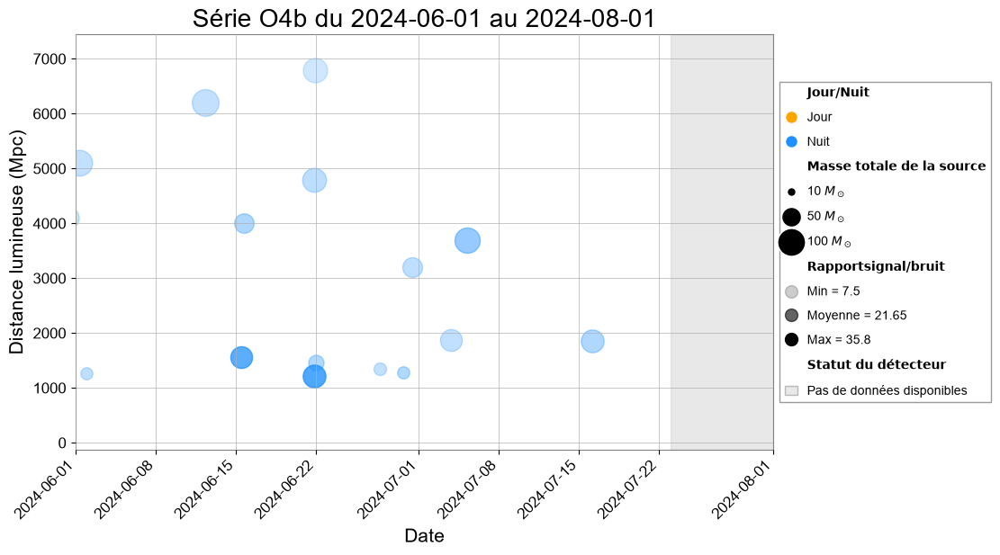

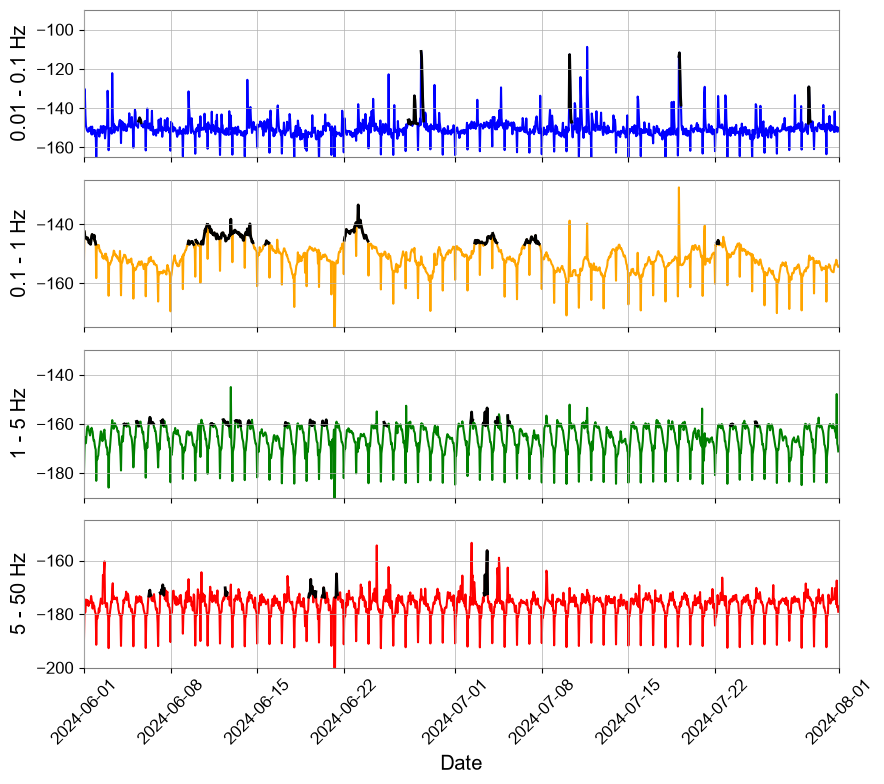

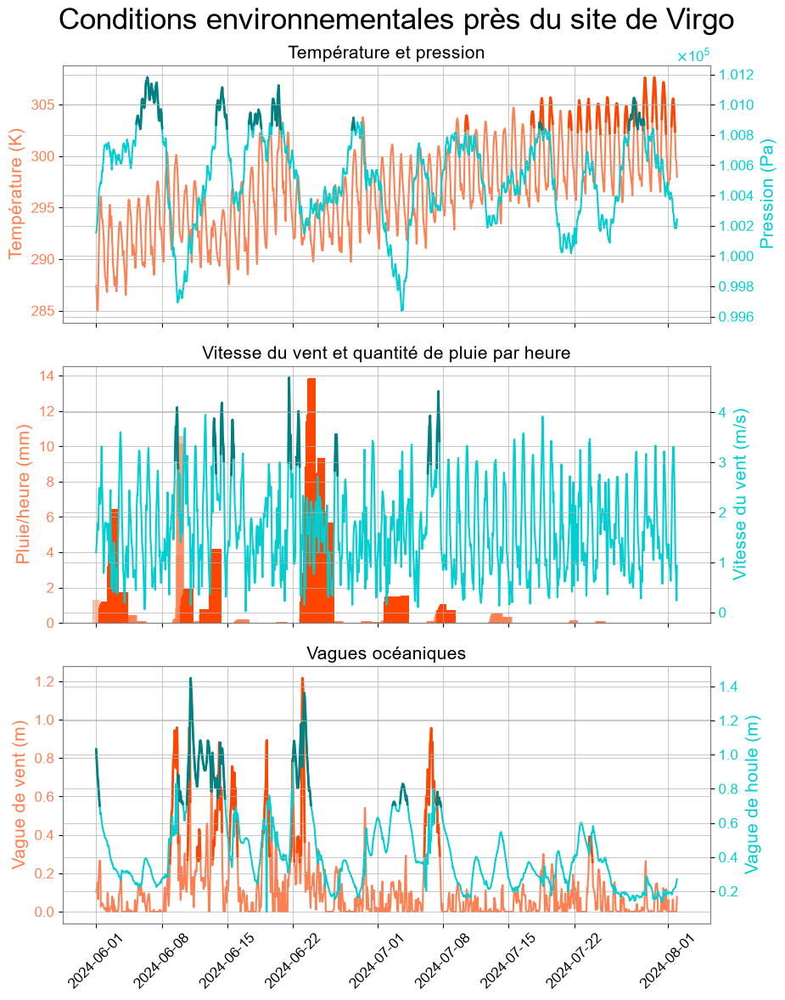

In [22]:
limx=(datetime(2024,6,1),datetime(2024,8,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx )
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx,  we=False, eq = False)
limx = ("2024-06-01","2024-08-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

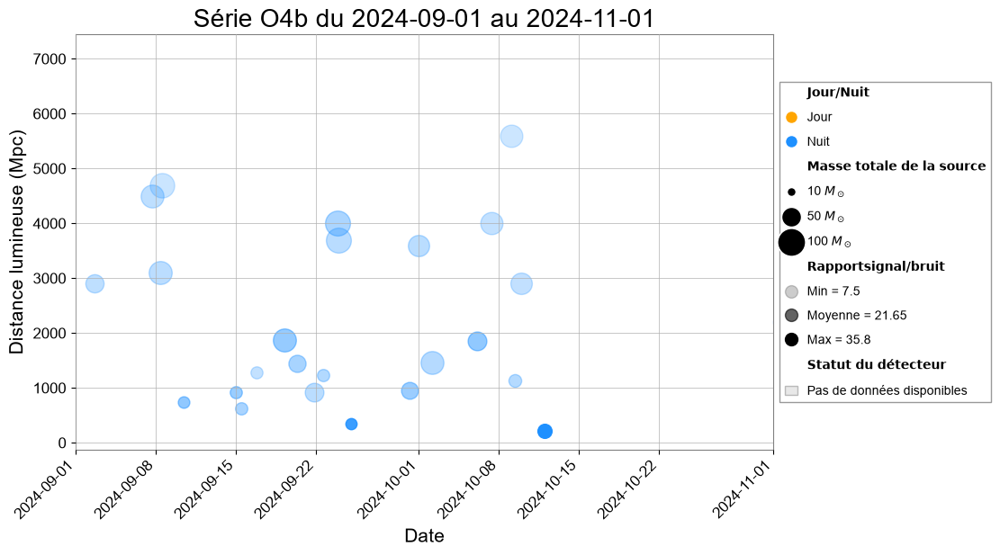

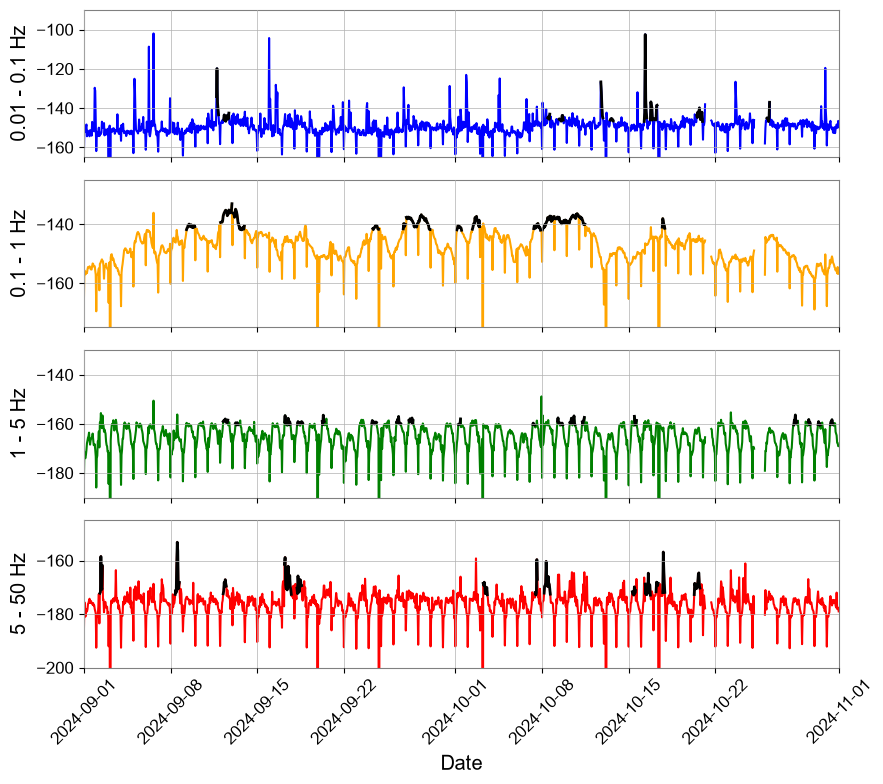

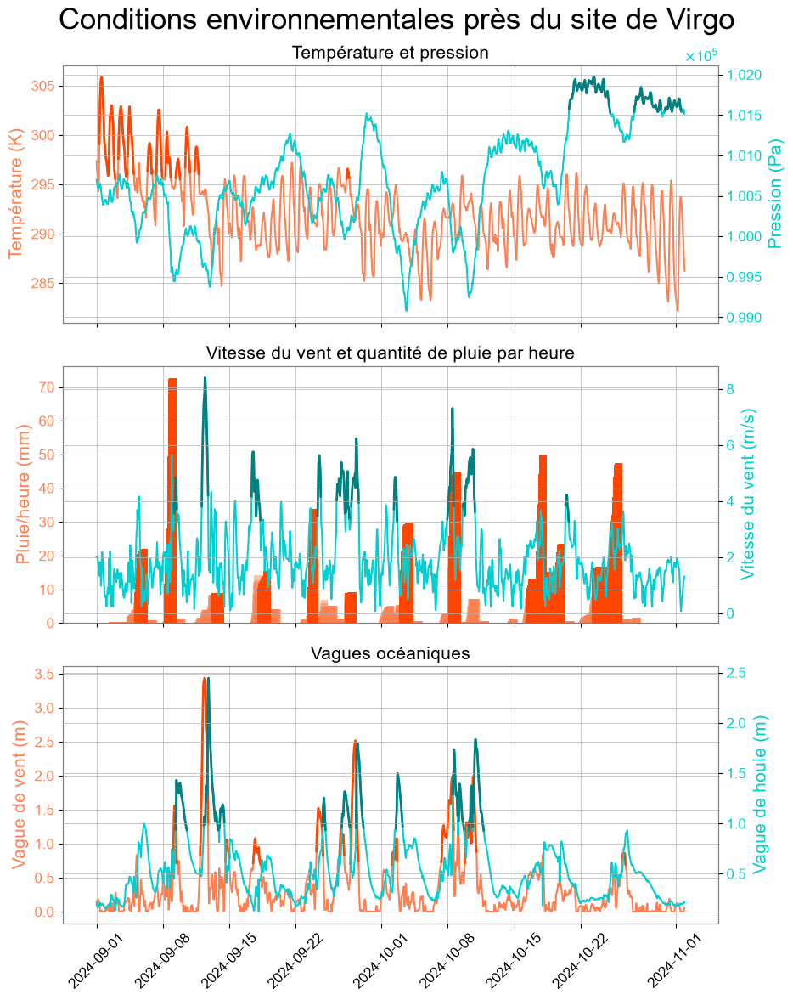

In [23]:
limx=(datetime(2024,9,1),datetime(2024,11,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx )
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx,  we=False, eq = False)
limx = ("2024-09-01","2024-11-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

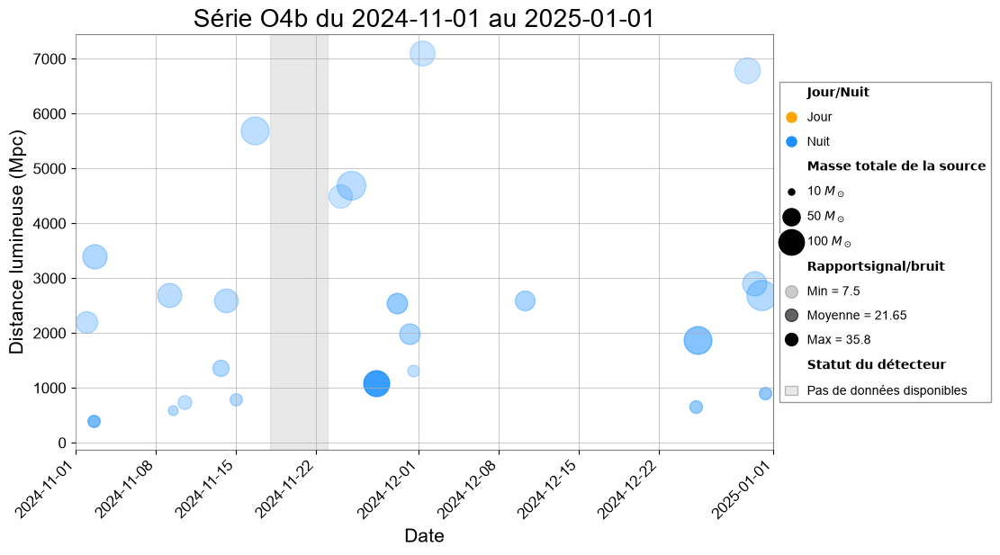

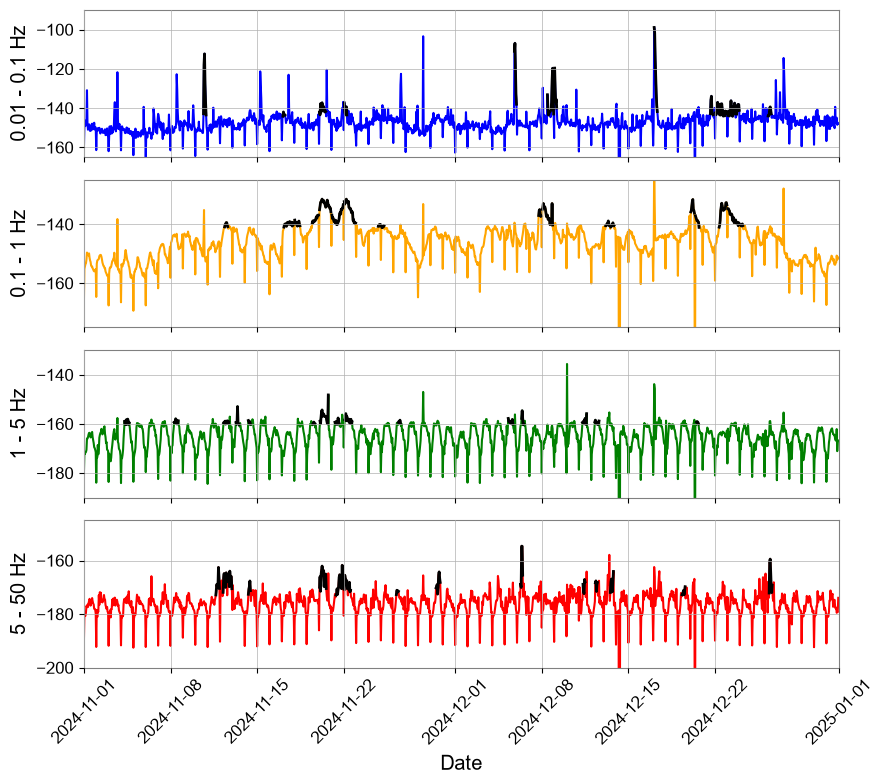

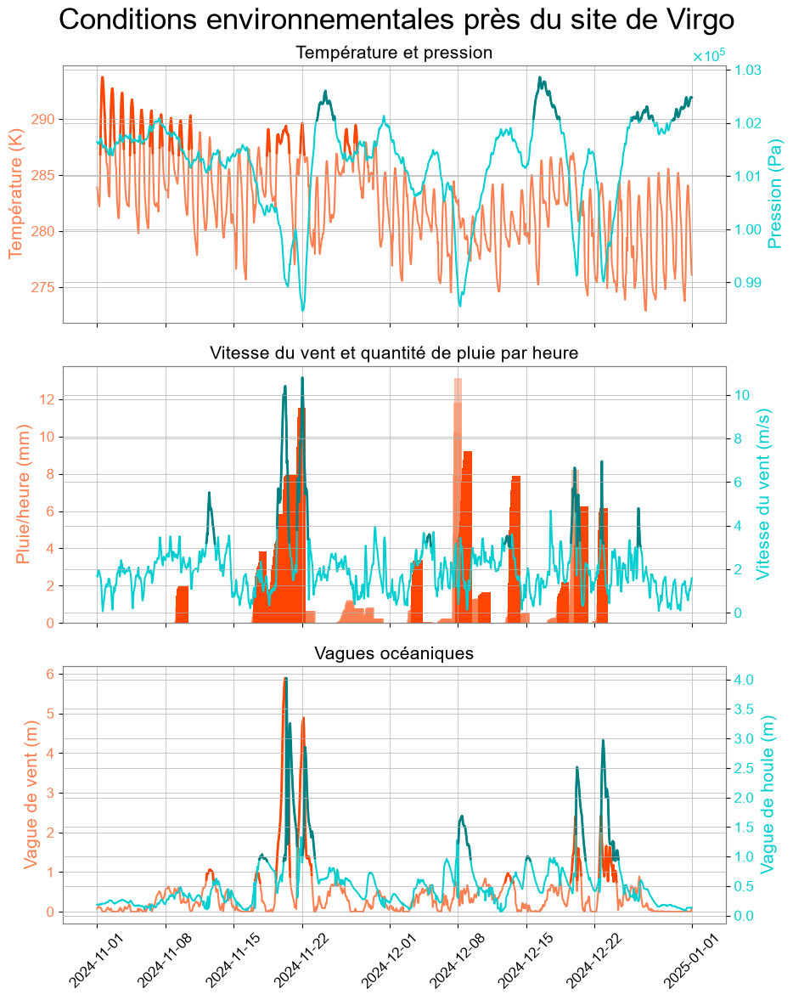

In [24]:
limx=(datetime(2024,11,1),datetime(2025,1,1))
fct.plot_events(data_24,"O4b", offline_periods=[(datetime(2024,1,16),datetime(2024,4,5)),(datetime(2024,7,23),datetime(2024,8,1)),(datetime(2024,11,18),datetime(2024,11,23))], lim =limx )
fct.median_4_bis(psd_p_24, dates_p_24, freqs_p_24,limx=limx, we=False, eq = False)
limx = ("2024-11-01","2025-01-01")
fct.plot_environment("virgo_tempp_2024.nc","virgo_press_2024.nc", "virgo_wind_2024_hour.nc", 'virgo_rain_2024.nc', "virgo_ocean_2024_data.nc", limx=limx, p=85, n=8)

# ANALYSE SUR 1 MOIS (bandes de fréquences)

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

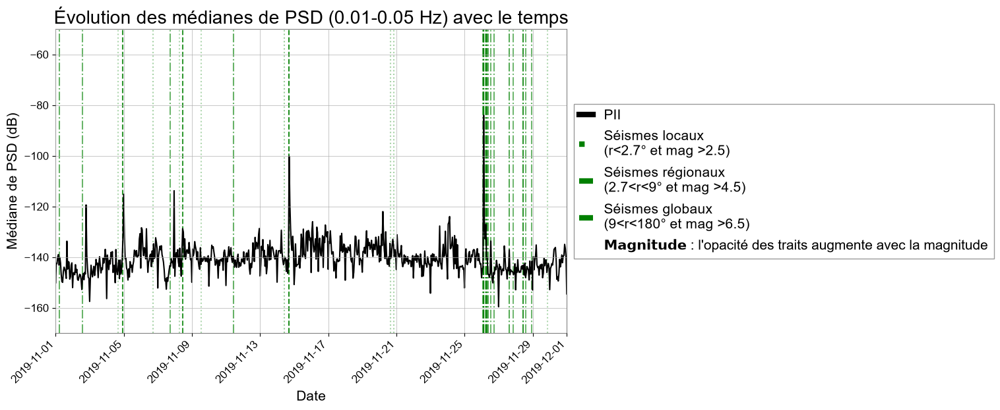

In [25]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=0.01, f2=0.05, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)),limy=(-170,-50), plot=True, we = False, eq=True,outfile="seisme")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

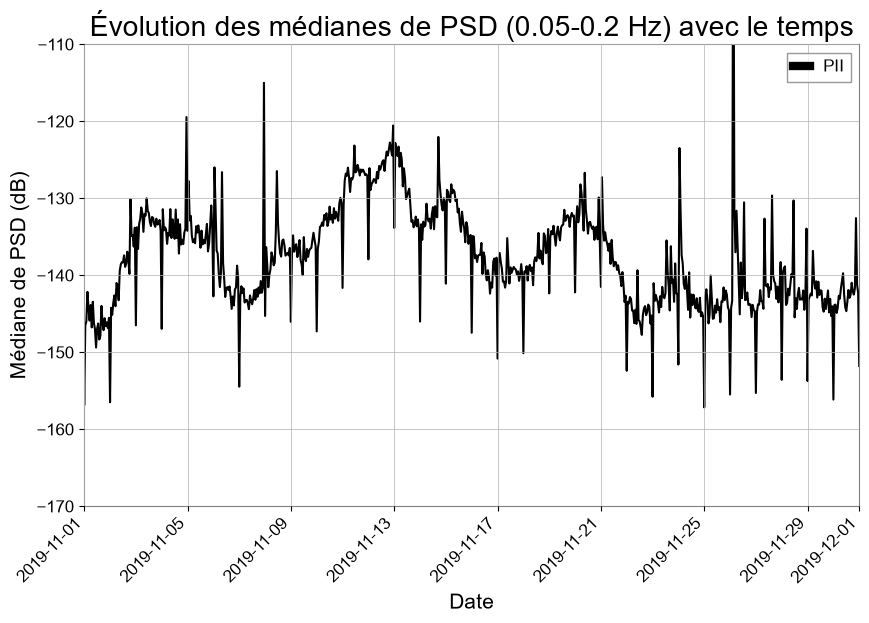

In [26]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=0.05, f2=0.2, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)), limy=(-170,-110), plot=True, we = False, eq=False,outfile="vague")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

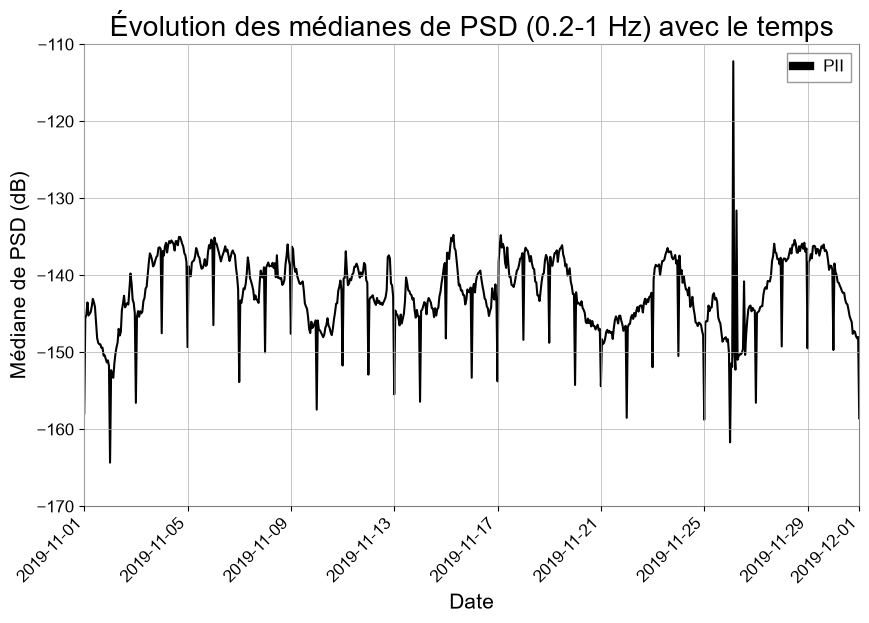

In [27]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=0.2, f2=1, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)), limy=(-170,-110), plot=True, we = False, eq=False,outfile="envt")

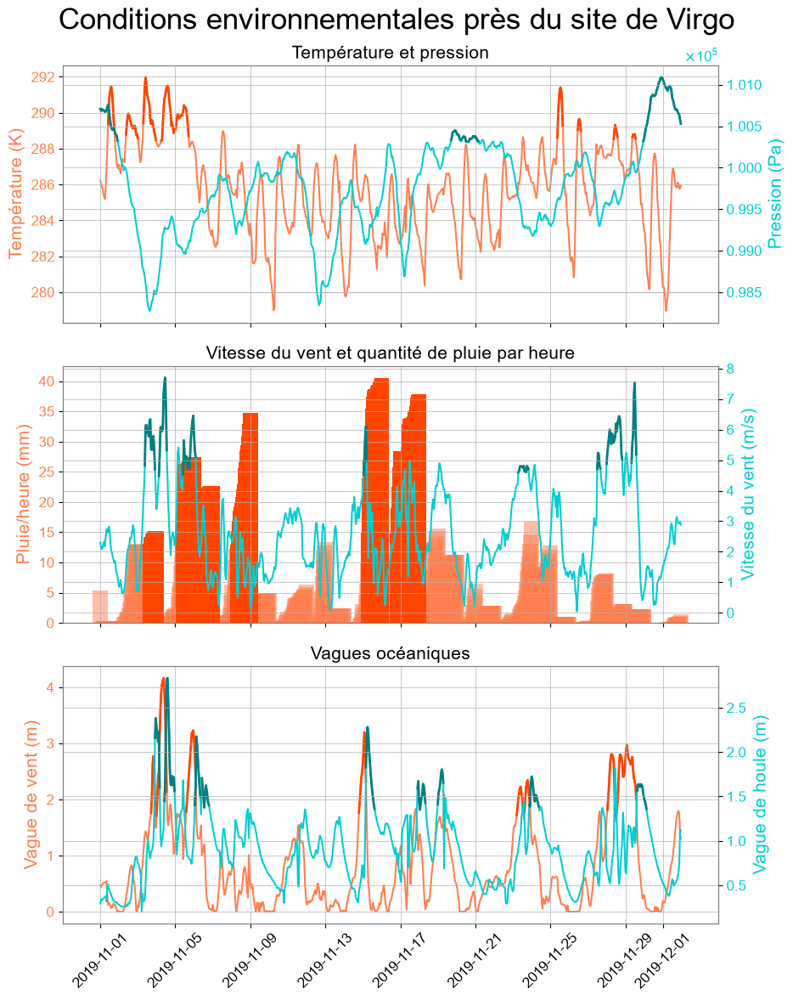

In [28]:
fct.plot_environment("virgo_temp_2019.nc","virgo_press_2019.nc", "virgo_wind_2019_hour.nc", 'virgo_rain_2019.nc', "virgo_ocean_2019_data.nc", limx=("2019-11-01","2019-12-01"), p=85, n=5,outfile="meteo")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

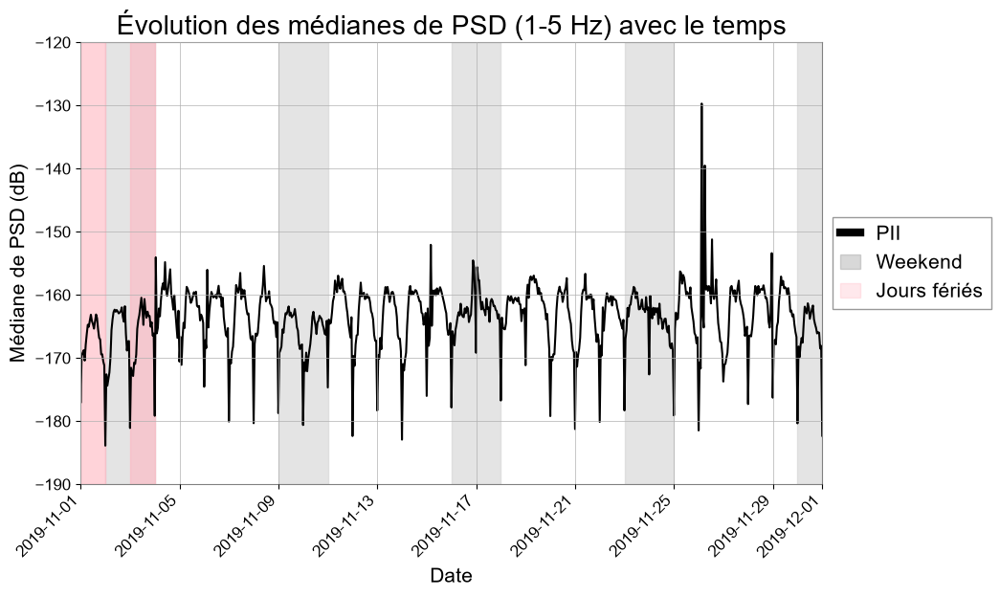

In [29]:
m=fct.median_plot(psd_p_19 , dates_p_19, freqs_p_19, f1=1, f2=5, labell = "PII",limx=(datetime(2019,11,1),datetime(2019,12,1)),limy=(-190,-120), plot=True, we = True, eq=False,outfile="anthropique")

# STAT PSD

## Corrélation psd 


In [30]:
all_dates, median_psd_02_1=fct.median_plot(psd_p_19, dates_p_19, freqs_p_19, f1=0.2, f2=1, labell = "PII", plot=False, we = False, eq=False)
all_dates, median_psd_001_02=fct.median_plot(psd_p_19, dates_p_19, freqs_p_19, f1=0.2, f2=1, labell = "PII", plot=False, we = False, eq=False)
all_dates, median_psd_1_5=fct.median_plot(psd_p_19, dates_p_19, freqs_p_19, f1=1, f2=5, labell = "PII", plot=False, we = False, eq=False)

data_rain = xr.open_dataset('virgo_rain_2019.nc', engine='netcdf4')
rain = data_rain['tp']
rain_y,dates = fct.select_data(rain,"2019-01-01","2019-12-31")

data= xr.open_dataset("virgo_ocean_2019_data.nc", engine='netcdf4')
wind_data = fct.get_wind_speed('virgo_wind_2019_hour.nc')
wind_y,dates = fct.select_data(wind_data, "2019-01-01","2019-12-31",)

wind_w = data["shww"]
wind_w_y,dates = fct.select_data(wind_w,"2019-01-01","2019-12-31", lat = 43.5, lon = 10.3)

swell = data['shts']
swell_y,dates = fct.select_data(swell,"2019-01-01","2019-12-31", lat = 43.5, lon = 10.3)

df_psd_021 = pd.DataFrame(
    {"PSD 0.2-1Hz": median_psd_02_1},
    index=pd.to_datetime(all_dates)
)
df_psd_00102 = pd.DataFrame(
    {"PSD 0.01-0.2Hz": median_psd_001_02},
    index=pd.to_datetime(all_dates)
)

df_psd_15 = pd.DataFrame(
    {"PSD 1-5Hz": median_psd_1_5},
    index=pd.to_datetime(all_dates)
)

df_wind_w = pd.DataFrame(
    {"Vagues de vent": wind_y},
    index=pd.to_datetime(dates)
)
df_wind = pd.DataFrame(
    {"Vent": wind_y},
    index=pd.to_datetime(dates)
)
df_swell = pd.DataFrame(
    {"Vagues de houle": swell_y},
    index=pd.to_datetime(dates)
)

df_rain = pd.DataFrame(
    {"Pluie": rain_y},
    index=pd.to_datetime(dates)
)

df_day = pd.DataFrame(
    {"jour": all_dates.weekday + 1},
    index=all_dates
)

df_hour = pd.DataFrame(
    {"Heure": all_dates.hour},
    index=all_dates
)

df = df_psd_021.join(df_psd_00102, how = "inner")
df = df.join(df_wind_w, how="inner")
df = df.join(df_wind, how="inner")

df = df.join(df_swell, how="inner")

df = df.join(df_rain, how="inner")

df = df.join(df_hour, how="inner")
df = df.join(df_day, how="inner")

df = df.join(df_psd_15, how="inner")

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

Calcul des médianes...


  0%|          | 0/8525 [00:00<?, ?it/s]

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

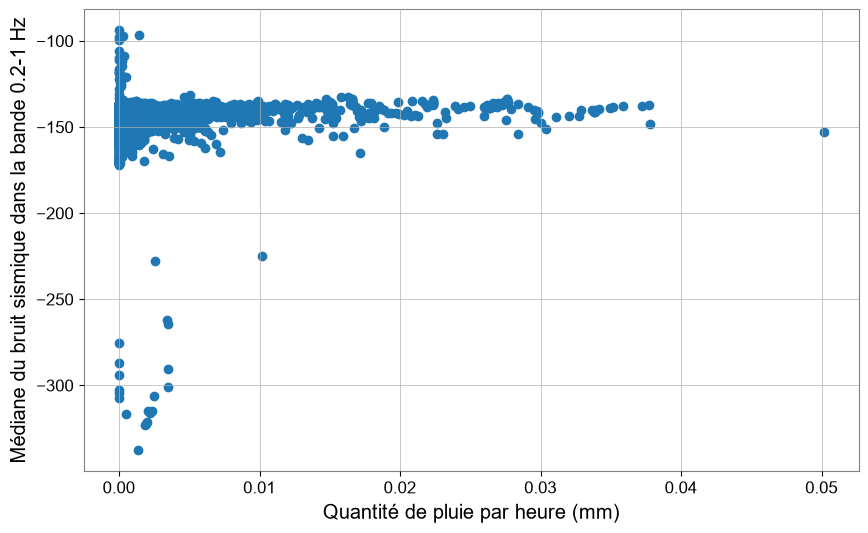

In [31]:
plt.figure(figsize=(10, 6))
plt.scatter(df["Pluie"],df["PSD 0.2-1Hz"])
plt.xlabel("Quantité de pluie par heure (mm)")
plt.ylabel('Médiane du bruit sismique dans la bande 0.2-1 Hz')
plt.show()

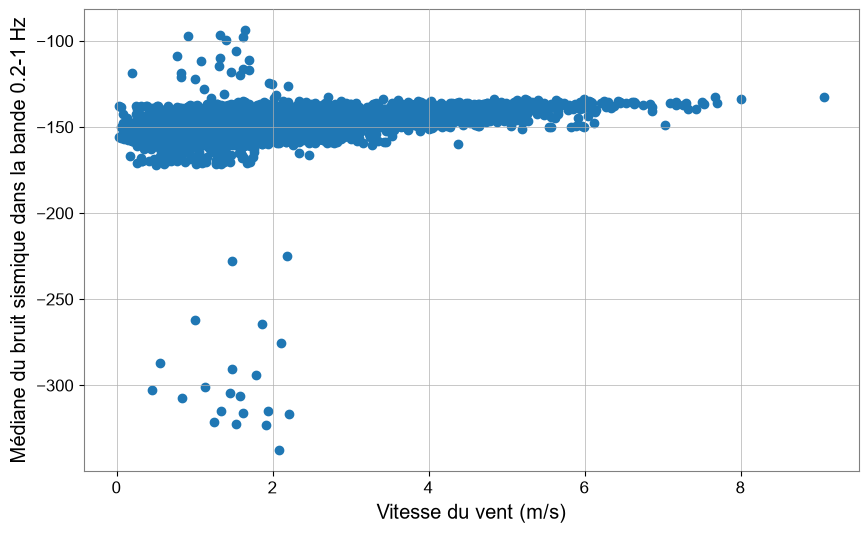

In [32]:
plt.figure(figsize=(10, 6))
plt.scatter(df["Vent"],df["PSD 0.2-1Hz"])
plt.xlabel("Vitesse du vent (m/s)")
plt.ylabel('Médiane du bruit sismique dans la bande 0.2-1 Hz')
plt.show()

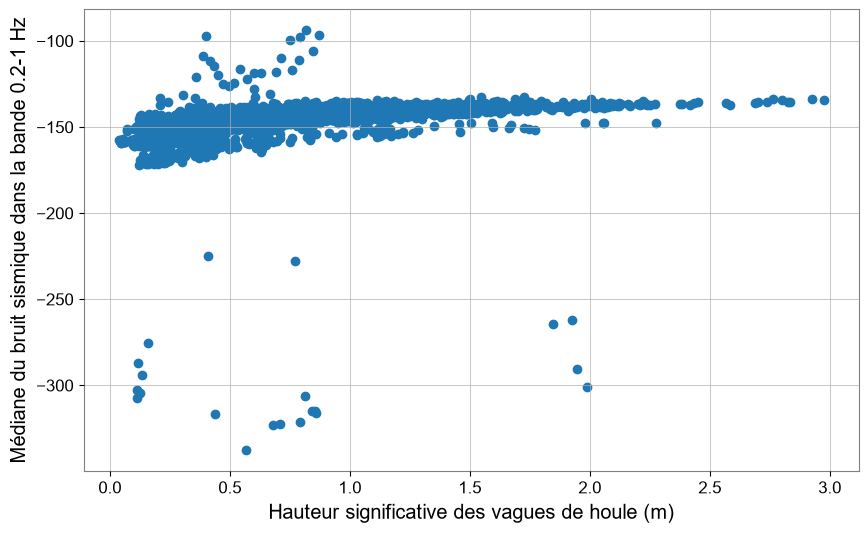

In [33]:
plt.figure(figsize=(10, 6))
plt.scatter(df["Vagues de houle"],df["PSD 0.2-1Hz"])
plt.xlabel("Hauteur significative des vagues de houle (m)")
plt.ylabel('Médiane du bruit sismique dans la bande 0.2-1 Hz')
plt.show()

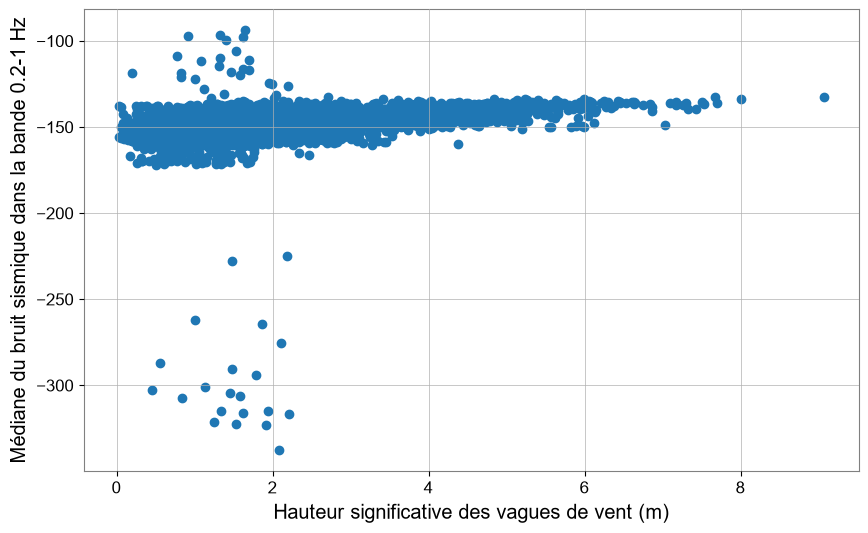

In [34]:
plt.figure(figsize=(10, 6))
plt.scatter(df["Vagues de vent"],df["PSD 0.2-1Hz"])
plt.xlabel("Hauteur significative des vagues de vent (m)")
plt.ylabel('Médiane du bruit sismique dans la bande 0.2-1 Hz')
plt.show()

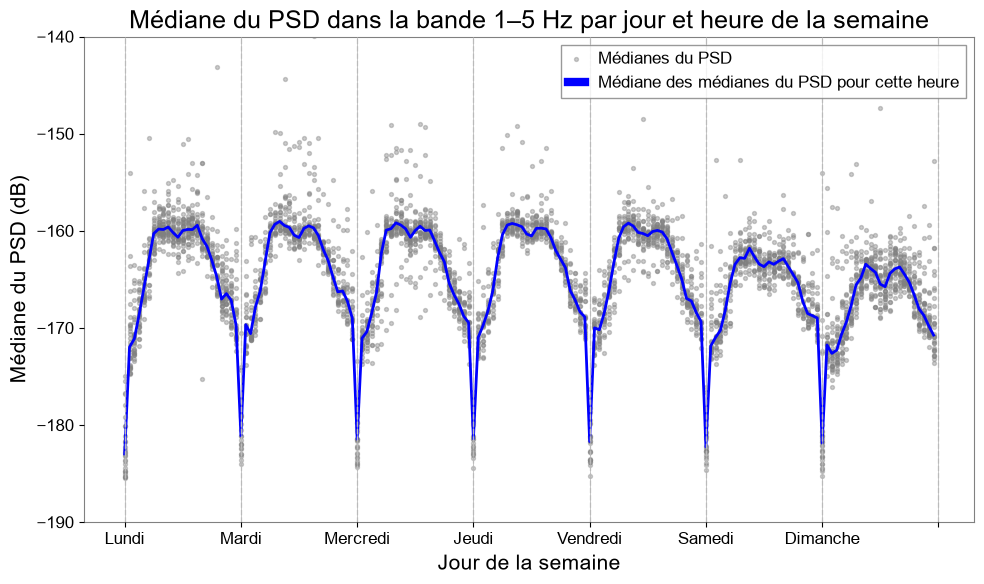

In [35]:
df["week_hour"] = (
    df.index.weekday * 24
    + df.index.hour
    + df.index.minute / 60
)


hour_points = df[["week_hour", "PSD 1-5Hz"]]

hour_median = (
    df.groupby("week_hour")["PSD 1-5Hz"]
    .median()
)

plt.figure(figsize=(10, 6))

plt.scatter(
    hour_points["week_hour"],
    hour_points["PSD 1-5Hz"],
    color="grey",
    s=8,
    alpha=0.4, label = "Médianes du PSD"
)

plt.plot(
    hour_median.index,
    hour_median.values,
    color="blue",
    linewidth=2,
    label="Médiane des médianes du PSD pour cette heure"
)

for h in range(0, 169, 24):
    plt.axvline(
        h,
        color="lightgrey",
        linestyle="--",
        linewidth=1
    )
plt.xticks(
    np.arange(0, 169, 24),
    ["Lundi", "Mardi", "Mercredi", "Jeudi", "Vendredi", "Samedi", "Dimanche", ""]
)

plt.xlabel("Jour de la semaine",size=15)
plt.ylabel("Médiane du PSD (dB)",size=15)
plt.title("Médiane du PSD dans la bande 1–5 Hz par jour et heure de la semaine",size=18)
plt.grid(axis="y")
plt.ylim(-190, -140)

plt.legend()

plt.tight_layout()
plt.savefig("medianemediane.png", dpi=300, bbox_inches="tight")

plt.show()

## Poisson

In [36]:
df_poisson = O4b_data.copy() 
df_poisson  = df_poisson.set_index("date")
events_per_day = df_poisson.resample("D").size()

In [37]:
moyenne = events_per_day.mean()
variance = events_per_day.var(ddof=1)   # ou np.var(events_per_week, ddof=1)

print(moyenne)
print(variance)
print("Variance / moyenne =", variance / moyenne)

0.508833922261484
0.6763401248026465
Variance / moyenne = 1.3291962174940901


# BNS range

In [38]:
df_O2=fct.process_data("O2")
df_O3a=fct.process_data("O3a")
df_O3b=fct.process_data("O3b")
df_O4b=fct.process_data("O4b")

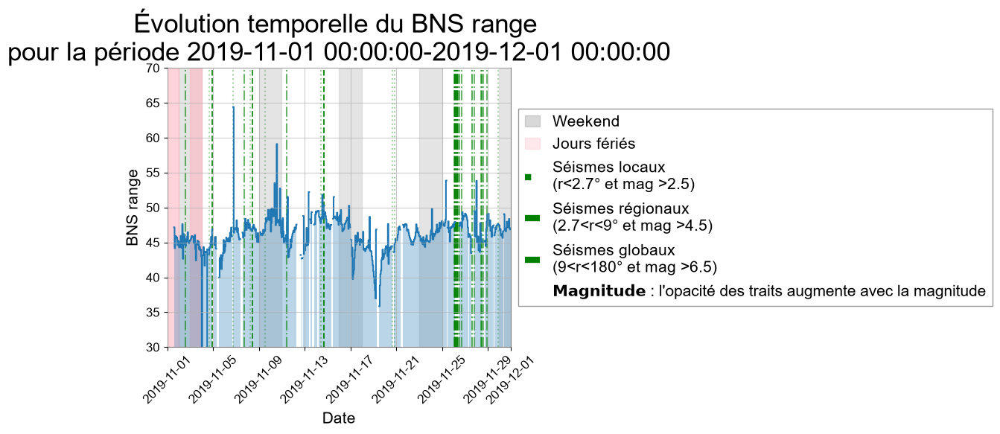

In [39]:
fct.plot_sensitivity(df_O3b,ylim=(30,70),xlim=(datetime(2019,11,1),datetime(2019,12,1)),we=True, eq = True)

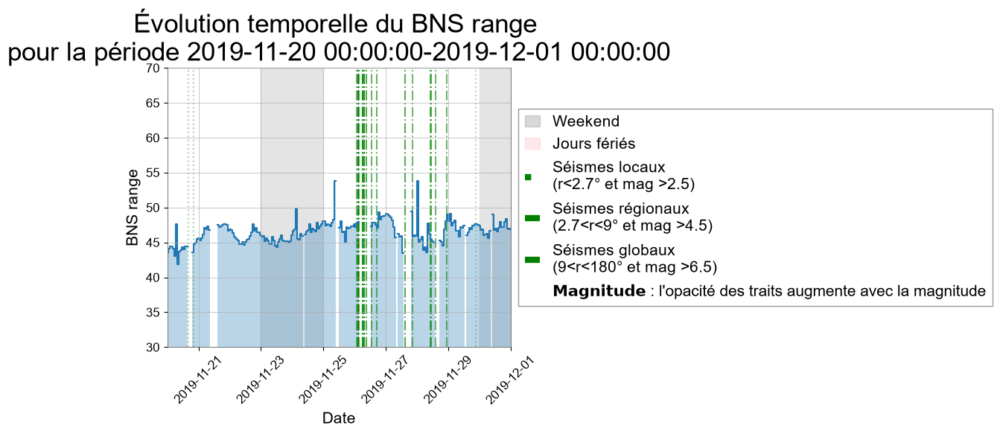

In [40]:
fct.plot_sensitivity(df_O3b,ylim=(30,70),xlim=(datetime(2019,11,20),datetime(2019,12,1)),we=True, eq = True)

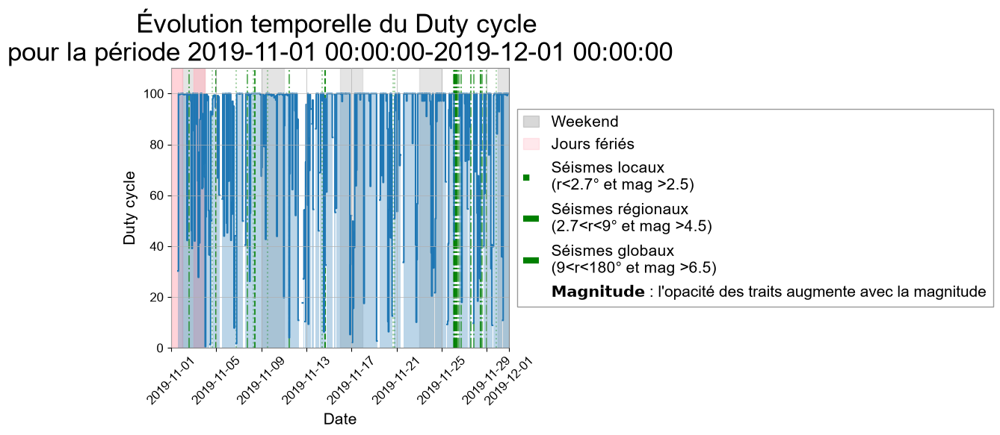

In [41]:
fct.plot_sensitivity(df_O3b,type="Duty cycle",xlim=(datetime(2019,11,1),datetime(2019,12,1)),ylim=(0,110),we=True, eq = True)

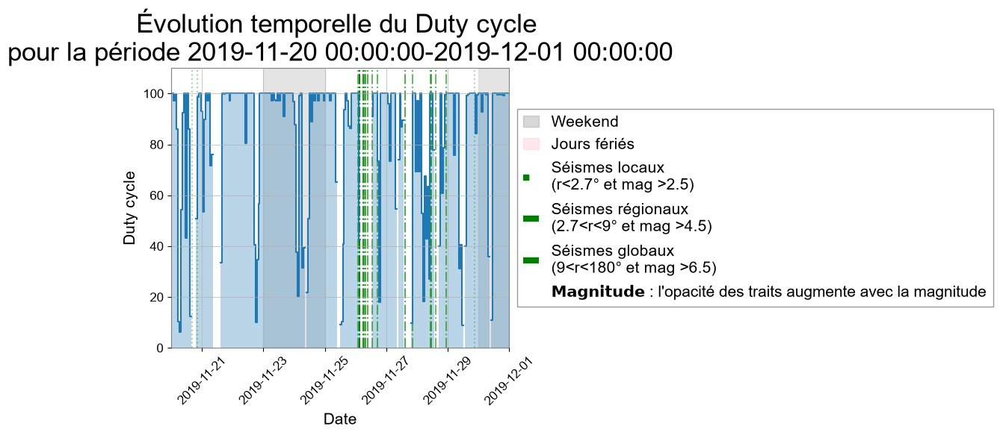

In [42]:
fct.plot_sensitivity(df_O3b,type="Duty cycle",xlim=(datetime(2019,11,20),datetime(2019,12,1)),ylim=(0,110),we=True, eq = True)

In [43]:
df_O3 = pd.concat([df_O3a, df_O3b])

In [44]:
df_O3 = df_O3.set_index("UTCstart")
df_O3 = df_O3.sort_index()

df_O3["BNS_daily_mean"] = (
    df_O3["BNS range"]
    .rolling("7D", center=True)
    .mean()
)

df_O3["BNS_d_fluctuation"] = (
    df_O3["BNS range"] - df_O3["BNS_daily_mean"]
)


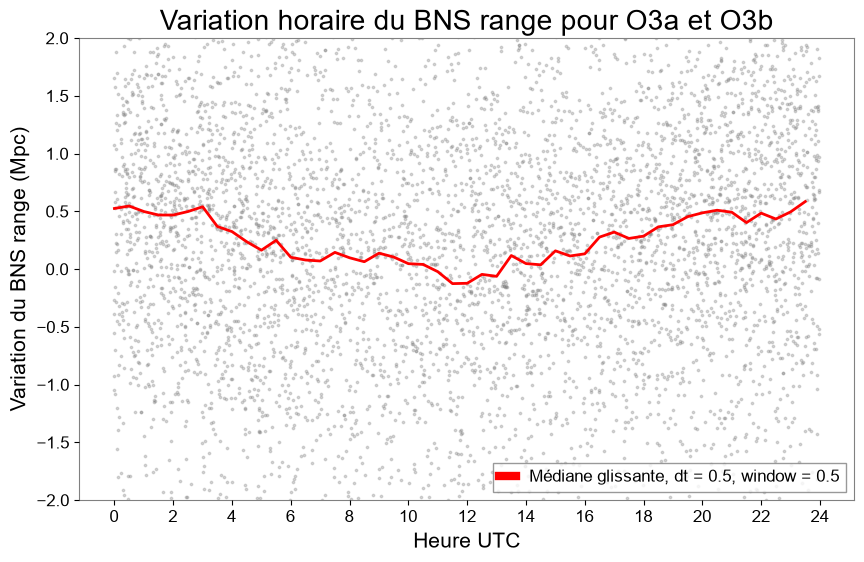

In [45]:
df_O3["hour"] = (
    df_O3.index.hour 
    + df_O3.index.minute/60
)

hours, median_profile = fct.get_median_profile(df_O3,param_1="BNS_d_fluctuation",param_2="hour",dt=0.5,window=0.5)
plt.figure(figsize=(10, 6))

plt.scatter(
    df_O3["hour"],
    df_O3["BNS_d_fluctuation"],
    s=3,
    alpha=0.3, color = "grey"
)

plt.plot(
    hours,
    median_profile,
    color="red",
    linewidth=2,    label="Médiane glissante, dt = 0.5, window = 0.5"

)
plt.ylim(-2,2)
plt.xticks(np.arange(0,25,2))
plt.xlabel("Heure UTC", size=15)
plt.ylabel("Variation du BNS range (Mpc)",size=15)
plt.grid()
plt.title("Variation horaire du BNS range pour O3a et O3b", size = 20)
plt.legend()
plt.savefig("BNS_O3_d", dpi=300, bbox_inches="tight")
plt.show()

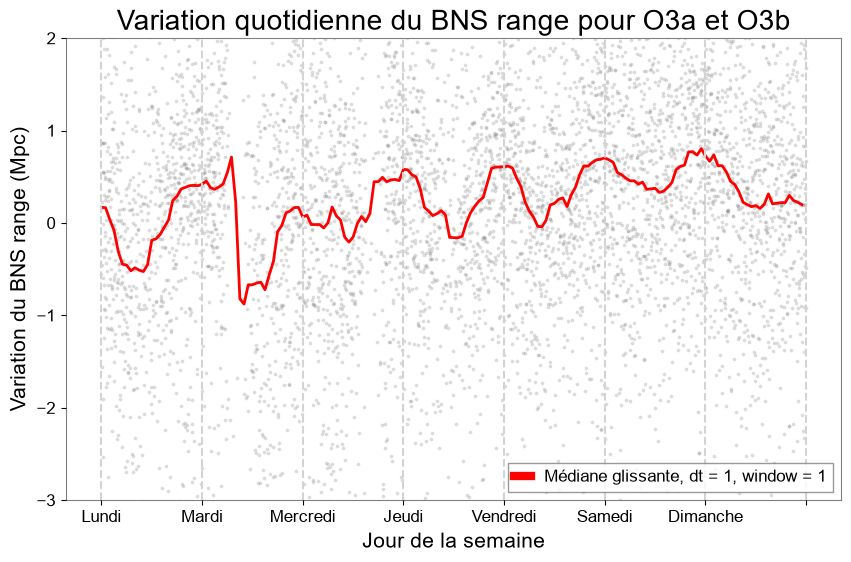

In [46]:
df_O3["Week_hour"] = (
    df_O3.index.dayofweek * 24
    + df_O3.index.hour
    + df_O3.index.minute / 60
)
week_hours, median_profile = fct.get_median_profile(df_O3,param_1="BNS_d_fluctuation",param_2="Week_hour",dt=1,window=2)

plt.figure(figsize=(10, 6))

plt.scatter(
    df_O3["Week_hour"],
    df_O3["BNS_d_fluctuation"],
    s=3,color="grey",
    alpha=0.2
)

plt.plot(
    week_hours,
    median_profile,
    color="red",
    linewidth=2,
    label="Médiane glissante, dt = 1, window = 1"
)


for h in range(0,169,24):
    plt.axvline(
        h,
        color="lightgrey",
        linestyle="--"
    )


plt.xticks(
    np.arange(0,169,24),
    [
        "Lundi",
        "Mardi",
        "Mercredi",
        "Jeudi",
        "Vendredi",
        "Samedi",
        "Dimanche",
        ""
    ]
)

plt.xlabel("Jour de la semaine", size = 15)
plt.ylabel("Variation du BNS range (Mpc)", size = 15)
plt.grid()
plt.legend()
plt.title("Variation quotidienne du BNS range pour O3a et O3b", size = 20)
plt.ylim(-3,2)
plt.savefig("bns_O3_w", dpi=300, bbox_inches="tight")
plt.show()

In [47]:
df_O3["round_hour"] = df_O3.index.floor("h")

df_O3 = df_O3.set_index("round_hour")
df_O3 = df_O3.sort_index()
df_merged = df.join(df_O3, how="outer")
df_merged

df_clean = df_merged.drop(df_merged["BNS range"].nsmallest(14).index)


In [48]:
list_dn = []
for i in df_clean.index:
    result = fct.day_or_night(i)
    list_dn.append(result)
df_clean["day_or_night"] = list_dn


In [49]:
df_clean

,PSD 0.2-1Hz,PSD 0.01-0.2Hz,Vagues de vent,Vent,Vagues de houle,Pluie,Heure,jour,PSD 1-5Hz,week_hour,...,Duty cycle,blrms200,blrms1000,BNS range,UTCend,BNS_daily_mean,BNS_d_fluctuation,hour,Week_hour,day_or_night
2019-01-04 00:00:00,NaN,NaN,1.349540,1.349540,0.153320,0.000002,0.0,5.0,NaN,96.0,...,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,nuit
2019-01-04 01:00:00,NaN,NaN,1.080022,1.080022,0.148682,0.000013,1.0,5.0,NaN,97.0,...,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,nuit
2019-01-04 02:00:00,NaN,NaN,0.414114,0.414114,0.143433,0.000039,2.0,5.0,NaN,98.0,...,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,nuit
2019-01-04 03:00:00,NaN,NaN,0.116075,0.116075,0.336182,0.000040,3.0,5.0,NaN,99.0,...,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,nuit
2019-01-04 04:00:00,NaN,NaN,0.120585,0.120585,0.319336,0.000043,4.0,5.0,NaN,100.0,...,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,nuit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-27 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,99.609375,3.921862e-22,8.373877e-22,46.129662,2020-03-27 13:20:19,52.085948,-5.956286,12.200000,108.200000,jour
2020-03-27 13:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,100.000000,3.788810e-22,7.525040e-22,46.592416,2020-03-27 14:28:35,52.029388,-5.436972,13.333333,109.333333,jour
2020-03-27 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,100.000000,3.573921e-22,7.109553e-22,48.480508,2020-03-27 15:36:51,51.959396,-3.478888,14.466667,110.466667,jour
2020-03-27 15:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,100.000000,1.569201e-22,6.408029e-22,50.211977,2020-03-27 16:45:07,51.895408,-1.683431,15.600000,111.600000,jour


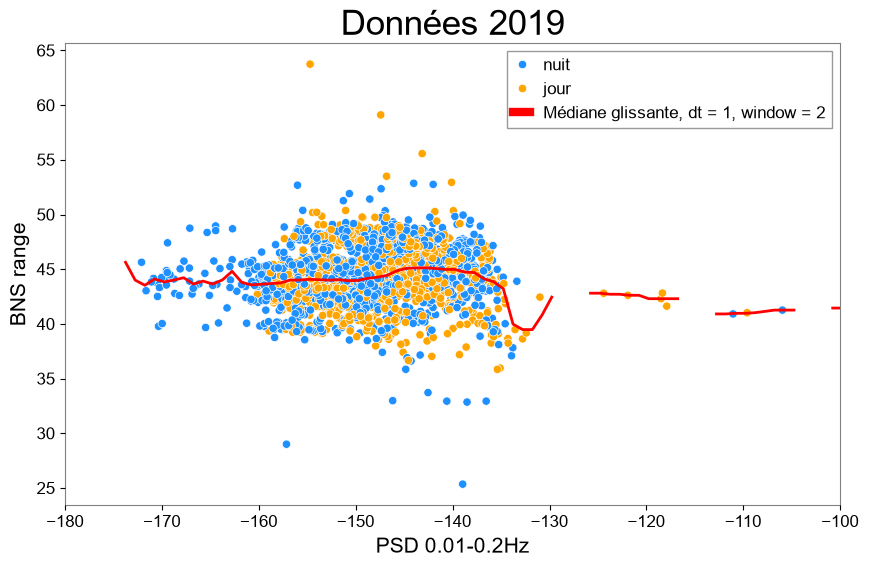

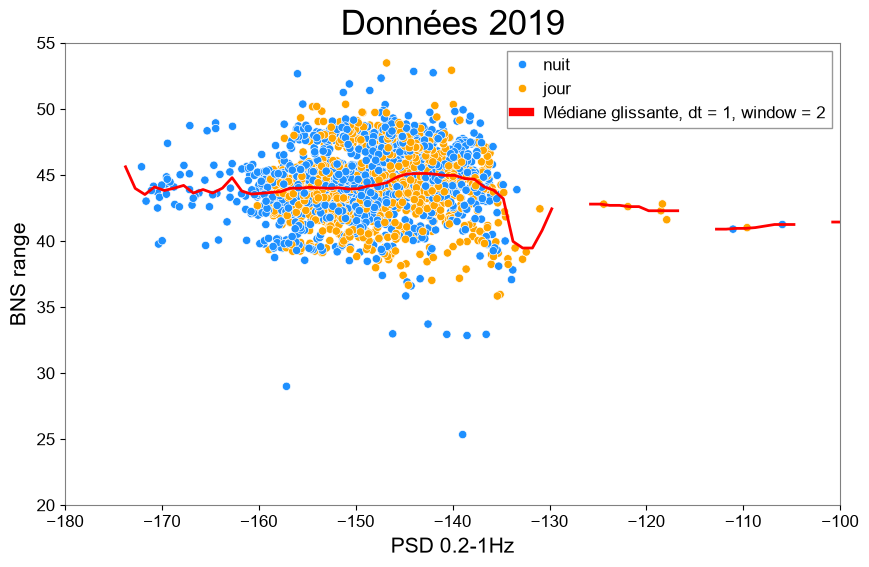

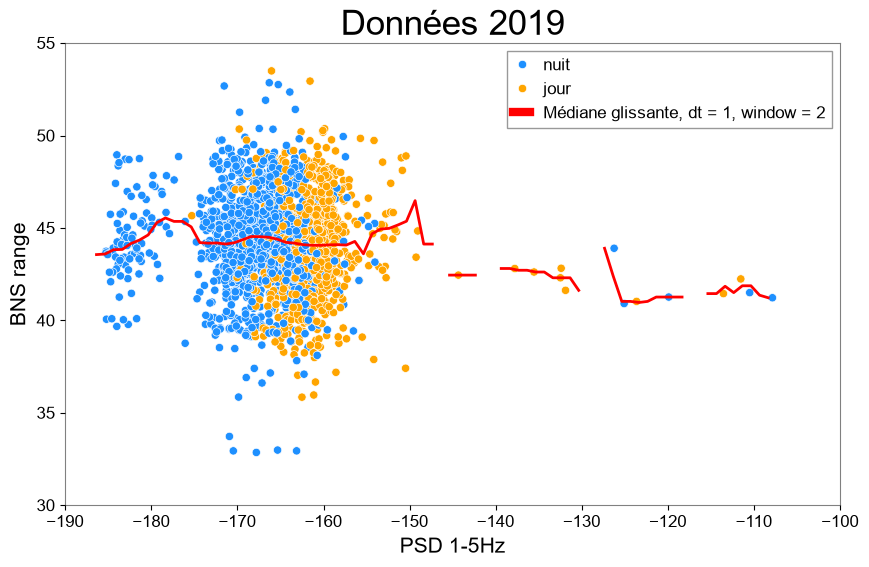

In [50]:
fct.plot_bns_param(df_clean, 'BNS range','PSD 0.01-0.2Hz',xlim=(-180,-100),dt=1, window = 2,title="Données 2019",outfile="BNS_O3_00102.png")
fct.plot_bns_param(df_clean,'BNS range', 'PSD 0.2-1Hz',xlim=(-180,-100),ylim=(20,55),dt=1, window = 2,title="Données 2019",outfile="BNS_O3_021.png")
fct.plot_bns_param(df_clean, 'BNS range','PSD 1-5Hz',xlim=(-190,-100),ylim=(30,55),dt=1,window = 2,title="Données 2019",outfile="BNS_O3_15.png")

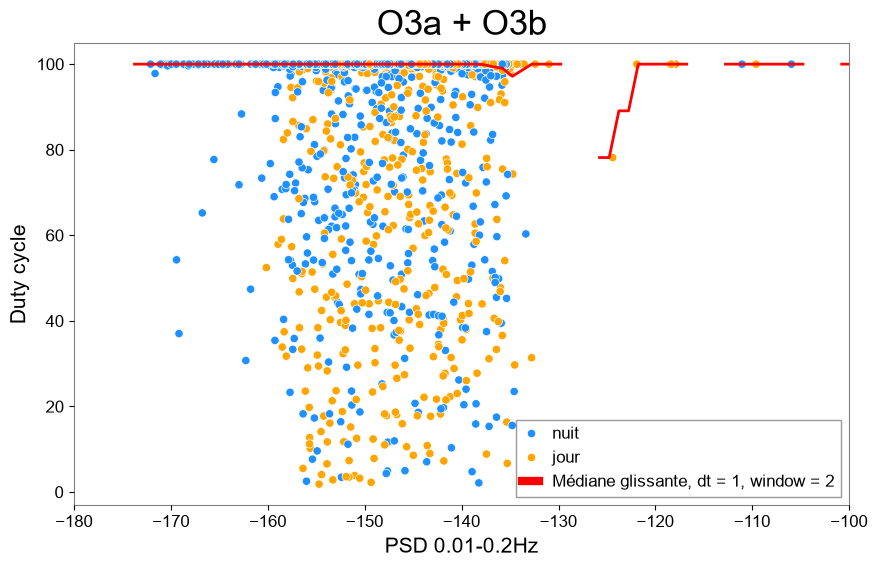

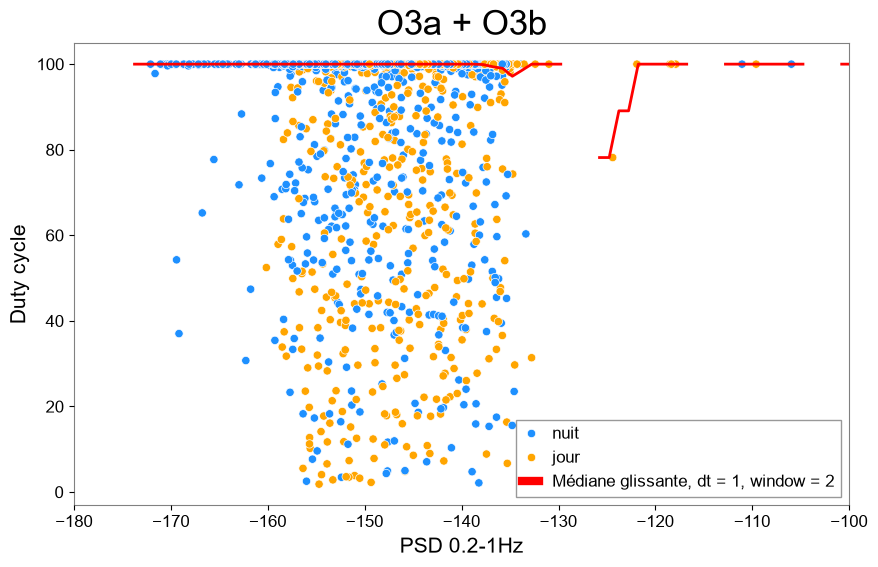

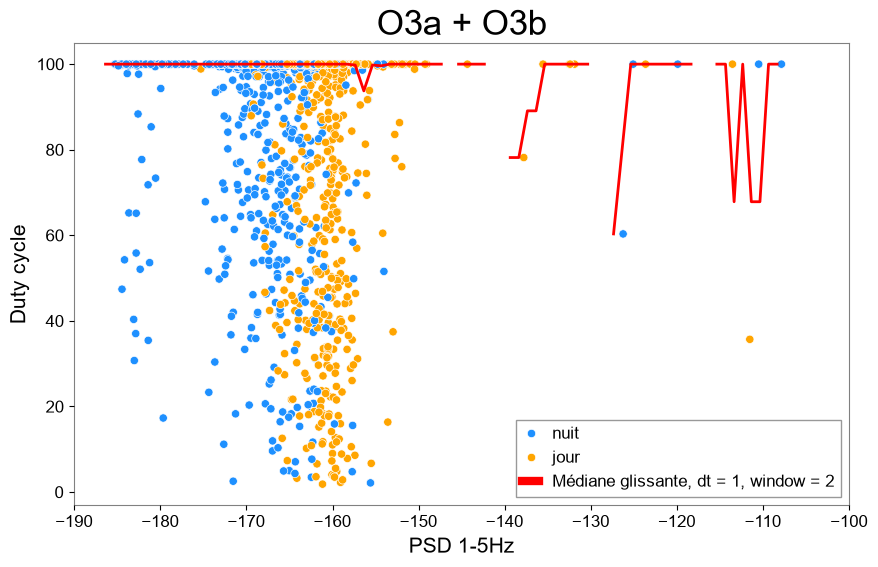

In [51]:
fct.plot_bns_param(df_clean, 'Duty cycle','PSD 0.01-0.2Hz',xlim=(-180,-100),dt=1, window = 2,title="O3a + O3b",outfile="DC_O3_00102.png")
fct.plot_bns_param(df_clean,'Duty cycle', 'PSD 0.2-1Hz',xlim=(-180,-100),dt=1, window = 2,title="O3a + O3b",outfile="DC_O3_00102.png")
fct.plot_bns_param(df_clean, 'Duty cycle','PSD 1-5Hz',xlim=(-190,-100),dt=1,window = 2,title="O3a + O3b",outfile="DC_O3_00102.png")

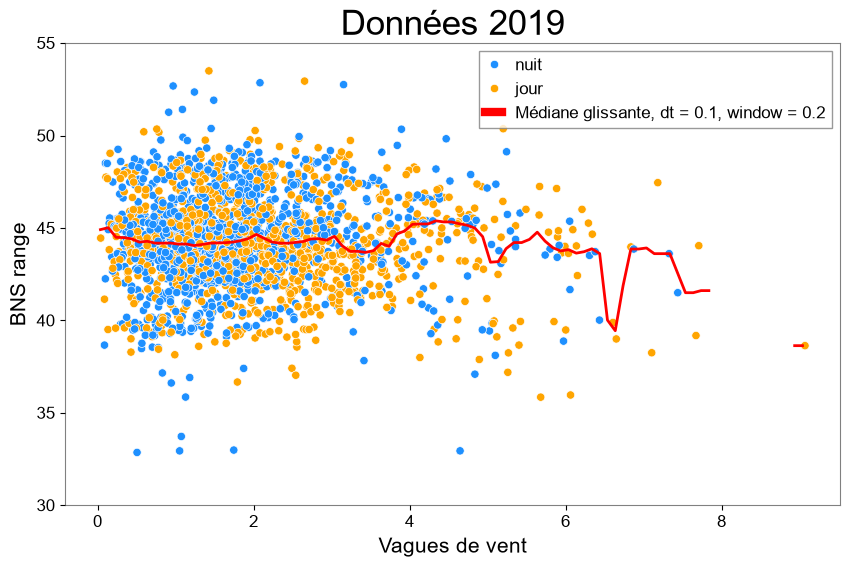

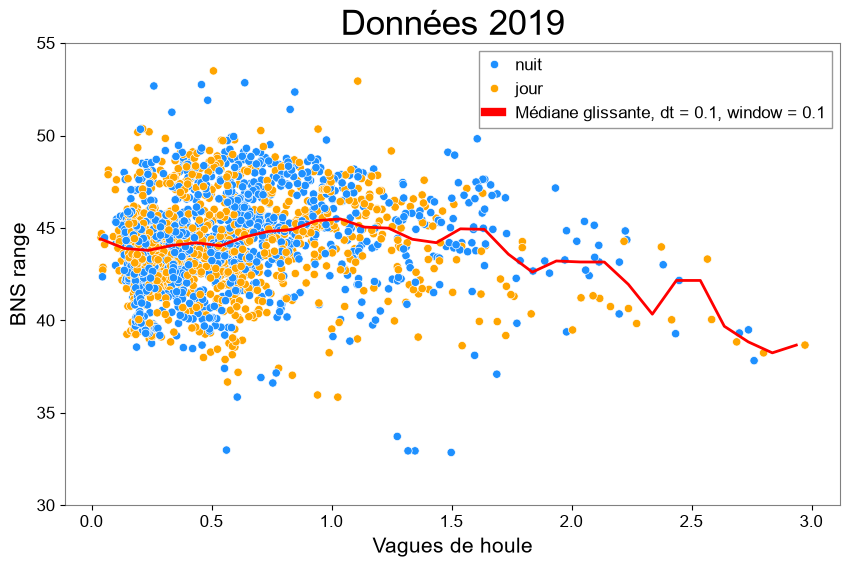

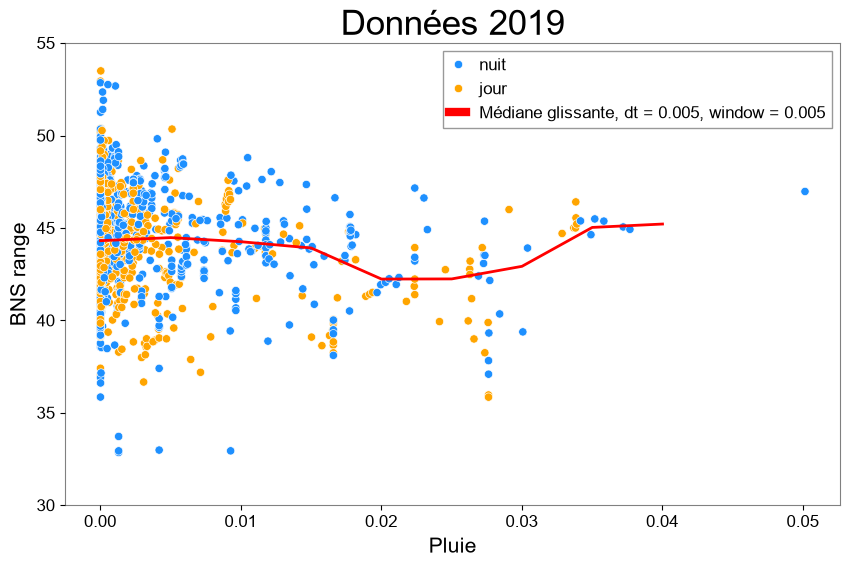

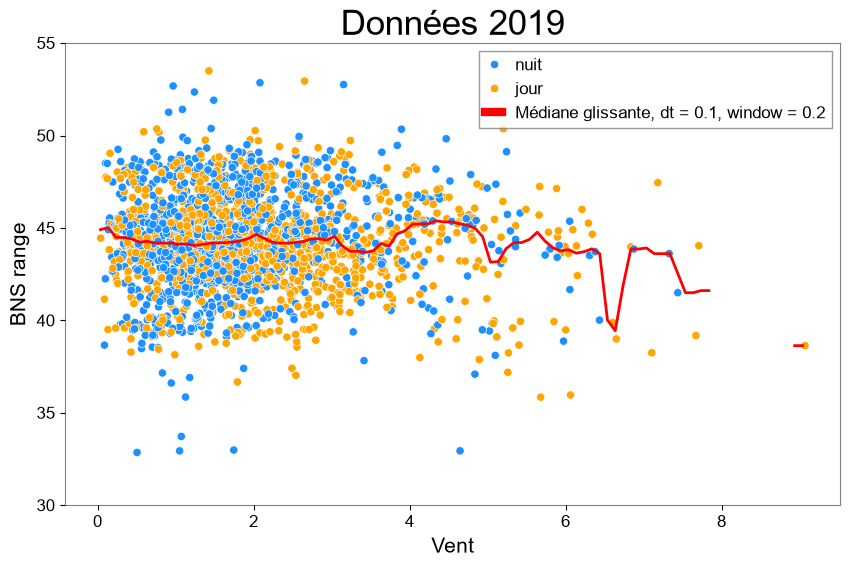

In [52]:
fct.plot_bns_param(df_clean, 'BNS range','Vagues de vent',ylim=(30,55), dt = 0.1, window = 0.2,title="Données 2019",outfile="BNS_O3_ww.png")
fct.plot_bns_param(df_clean, 'BNS range','Vagues de houle',ylim=(30,55),dt=0.1,window=0.1,title="Données 2019",outfile="BNS_O3_sw.png")
fct.plot_bns_param(df_clean, 'BNS range','Pluie',ylim=(30,55),dt=0.005,window=0.005,title="Données 2019",outfile="BNS_O3_rain.png")
fct.plot_bns_param(df_clean, 'BNS range','Vent',ylim=(30,55),dt=0.1,window=0.2,title="Données 2019",outfile="BNS_O3_wind.png")

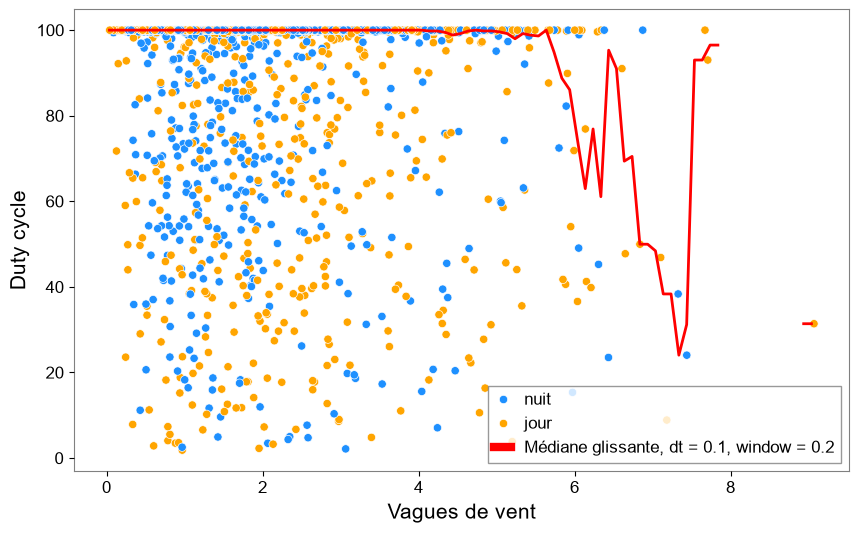

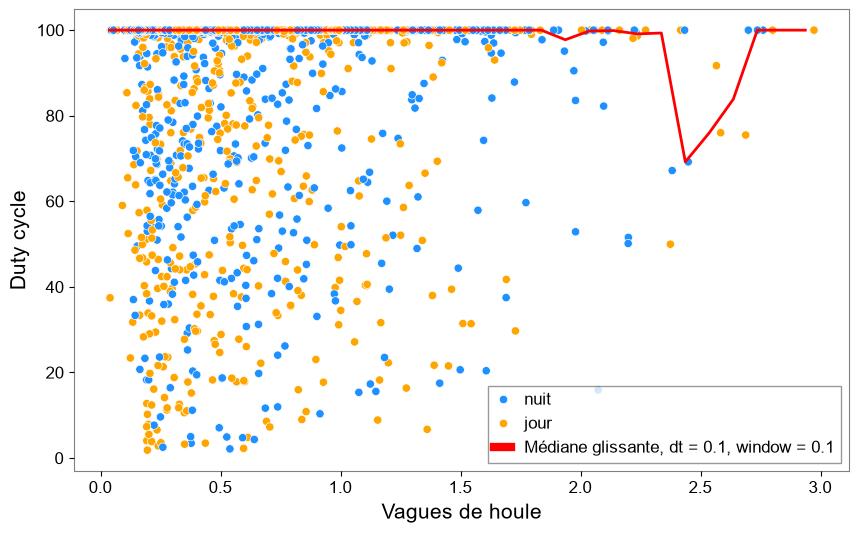

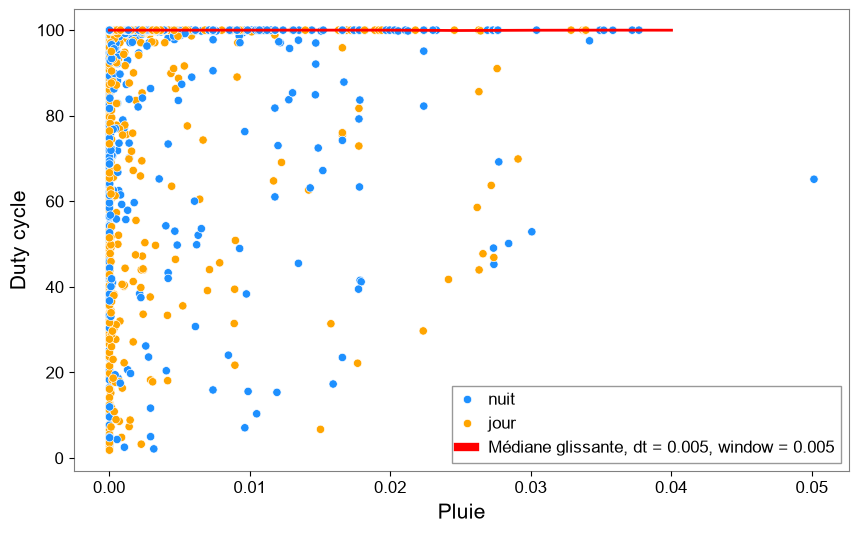

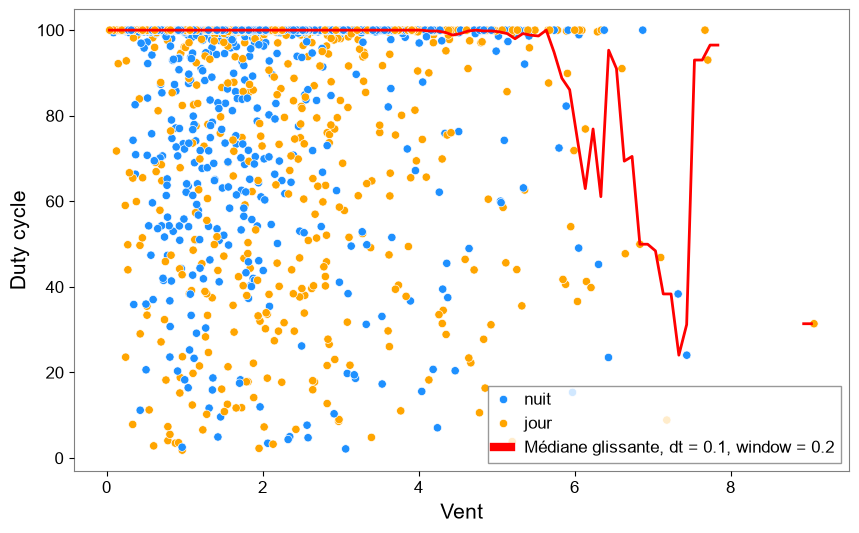

In [53]:
fct.plot_bns_param(df_clean, 'Duty cycle','Vagues de vent', dt = 0.1, window = 0.2)
fct.plot_bns_param(df_clean, 'Duty cycle','Vagues de houle',dt=0.1,window=0.1)
fct.plot_bns_param(df_clean, 'Duty cycle','Pluie',dt=0.005,window=0.005)
fct.plot_bns_param(df_clean, 'Duty cycle','Vent',dt=0.1,window=0.2)

## O4b

In [54]:
df_O4b = df_O4b.set_index("UTCstart")
df_O4b = df_O4b.sort_index()

df_O4b["BNS_daily_mean"] = (
    df_O4b["BNS range"]
    .rolling("7D", center=True)
    .mean()
)

df_O4b["BNS_d_fluctuation"] = (
    df_O4b["BNS range"] - df_O4b["BNS_daily_mean"]
)
df_O4b["hour"] = (
    df_O4b.index.hour 
    + df_O4b.index.minute/60
)

hours, median_profile = fct.get_median_profile(df_O4b,param_1="BNS_d_fluctuation",param_2="hour",dt=0.5,window=0.5)


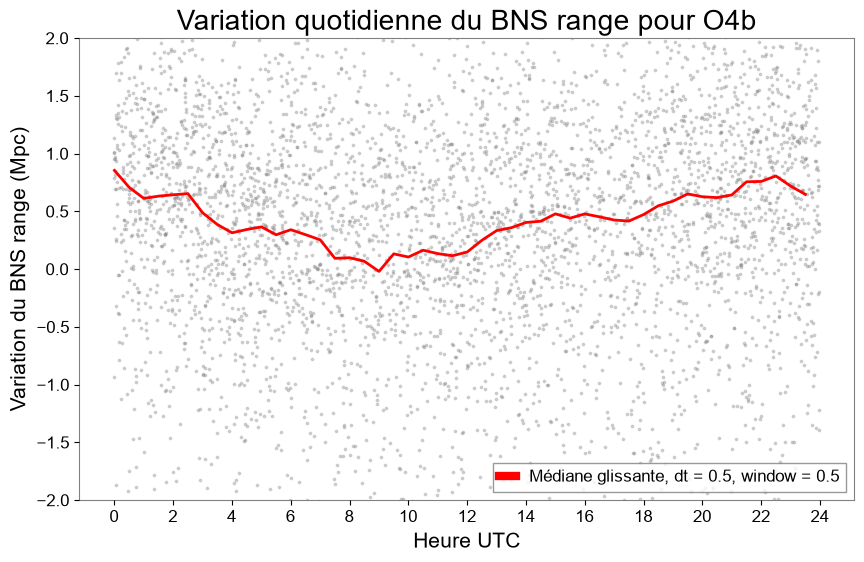

In [55]:
plt.figure(figsize=(10, 6))

plt.scatter(
    df_O4b["hour"],
    df_O4b["BNS_d_fluctuation"],
    s=3,
    alpha=0.3, color = "grey"
)

plt.plot(
    hours,
    median_profile,
    color="red",
    linewidth=2,    label="Médiane glissante, dt = 0.5, window = 0.5"

)
plt.ylim(-2,2)
plt.xticks(np.arange(0,25,2))
plt.xlabel("Heure UTC",size=15)
plt.ylabel("Variation du BNS range (Mpc)",size=15)
plt.title("Variation quotidienne du BNS range pour O4b",size=20)
plt.grid()
plt.legend()
plt.savefig("BNS_O4b_d", dpi=300, bbox_inches="tight")
plt.show()

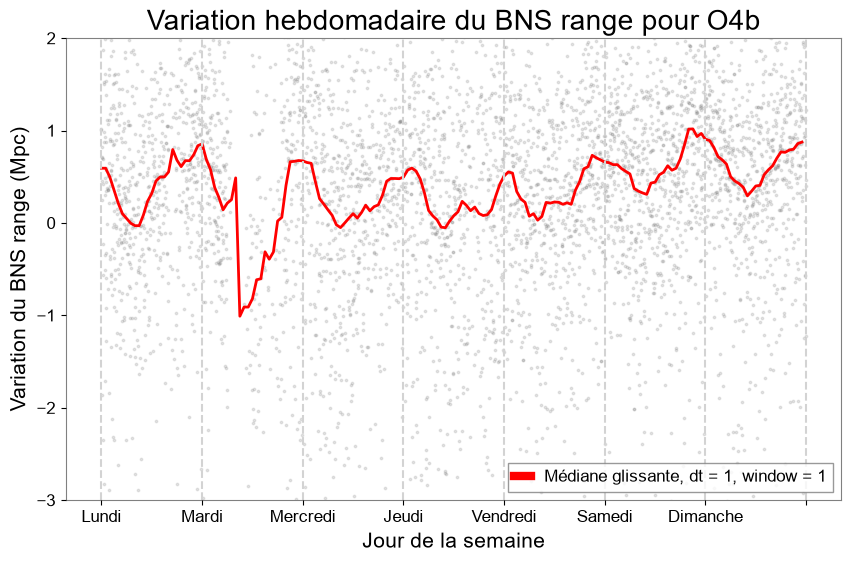

In [56]:
df_O4b["Week_hour"] = (
    df_O4b.index.dayofweek * 24
    + df_O4b.index.hour
    + df_O4b.index.minute / 60
)
week_hours, median_profile = fct.get_median_profile(df_O4b,param_1="BNS_d_fluctuation",param_2="Week_hour",dt=1,window=2)

plt.figure(figsize=(10, 6))

plt.scatter(
    df_O4b["Week_hour"],
    df_O4b["BNS_d_fluctuation"],
    s=3,color="grey",
    alpha=0.2
)

plt.plot(
    week_hours,
    median_profile,
    color="red",
    linewidth=2,
    label="Médiane glissante, dt = 1, window = 1"
)


for h in range(0,169,24):
    plt.axvline(
        h,
        color="lightgrey",
        linestyle="--"
    )


plt.xticks(
    np.arange(0,169,24),
    [
        "Lundi",
        "Mardi",
        "Mercredi",
        "Jeudi",
        "Vendredi",
        "Samedi",
        "Dimanche",
        ""
    ]
)

plt.xlabel("Jour de la semaine",size=15)
plt.ylabel("Variation du BNS range (Mpc)",size=15)
plt.grid()
plt.legend()
plt.ylim(-3,2)
plt.title("Variation hebdomadaire du BNS range pour O4b",size=20)
plt.savefig("bns_O4b_w", dpi=300, bbox_inches="tight")
plt.show()

In [57]:
all_dates, median_psd_02_1=fct.median_plot(psd_p_24, dates_p_24, freqs_p_24, f1=0.2, f2=1, labell = "PII", plot=False, we = False, eq=False)
all_dates, median_psd_001_02=fct.median_plot(psd_p_24, dates_p_24, freqs_p_24, f1=0.2, f2=1, labell = "PII", plot=False, we = False, eq=False)
all_dates, median_psd_1_5=fct.median_plot(psd_p_24, dates_p_24, freqs_p_24, f1=1, f2=5, labell = "PII", plot=False, we = False, eq=False)

data_rain = xr.open_dataset('virgo_rain_2024.nc', engine='netcdf4')
rain = data_rain['tp']
rain_y,dates = fct.select_data(rain,"2024-01-01","2024-12-31")

data= xr.open_dataset("virgo_ocean_2024_data.nc", engine='netcdf4')
wind_data = fct.get_wind_speed('virgo_wind_2024_hour.nc')
wind_y,dates = fct.select_data(wind_data, "2024-01-01","2024-12-31",)

wind_w = data["shww"]
wind_w_y,dates = fct.select_data(wind_w,"2024-01-01","2024-12-31", lat = 43.5, lon = 10.3)

swell = data['shts']
swell_y,dates = fct.select_data(swell,"2024-01-01","2024-12-31", lat = 43.5, lon = 10.3)

df_psd_021 = pd.DataFrame(
    {"PSD 0.2-1Hz": median_psd_02_1},
    index=pd.to_datetime(all_dates)
)
df_psd_00102 = pd.DataFrame(
    {"PSD 0.01-0.2Hz": median_psd_001_02},
    index=pd.to_datetime(all_dates)
)

df_psd_15 = pd.DataFrame(
    {"PSD 1-5Hz": median_psd_1_5},
    index=pd.to_datetime(all_dates)
)

df_wind_w = pd.DataFrame(
    {"Vagues de vent": wind_y},
    index=pd.to_datetime(dates)
)
df_wind = pd.DataFrame(
    {"Vent": wind_y},
    index=pd.to_datetime(dates)
)
df_swell = pd.DataFrame(
    {"Vagues de houle": swell_y},
    index=pd.to_datetime(dates)
)

df_rain = pd.DataFrame(
    {"Pluie": rain_y},
    index=pd.to_datetime(dates)
)

df_day = pd.DataFrame(
    {"jour": all_dates.weekday + 1},
    index=all_dates
)

df_hour = pd.DataFrame(
    {"Heure": all_dates.hour},
    index=all_dates
)

df = df_psd_021.join(df_psd_00102, how = "inner")
df = df.join(df_wind_w, how="inner")
df = df.join(df_wind, how="inner")

df = df.join(df_swell, how="inner")

df = df.join(df_rain, how="inner")

df = df.join(df_hour, how="inner")
df = df.join(df_day, how="inner")

df4 = df.join(df_psd_15, how="inner")

Calcul des médianes...


  0%|          | 0/8663 [00:00<?, ?it/s]

Calcul des médianes...


  0%|          | 0/8663 [00:00<?, ?it/s]

Calcul des médianes...


  0%|          | 0/8663 [00:00<?, ?it/s]

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [58]:
df_O4b["round_hour"] = df_O4b.index.floor("h")

df_O4b = df_O4b.set_index("round_hour")
df_O4b = df_O4b.sort_index()
df_merged = df4.join(df_O4b, how="outer")
df_merged

df_clean4 = df_merged.drop(df_merged["BNS range"].nsmallest(14).index)


In [59]:
list_dn = []
for i in df_clean4.index:
    result = fct.day_or_night(i)
    list_dn.append(result)
df_clean4["day_or_night"] = list_dn


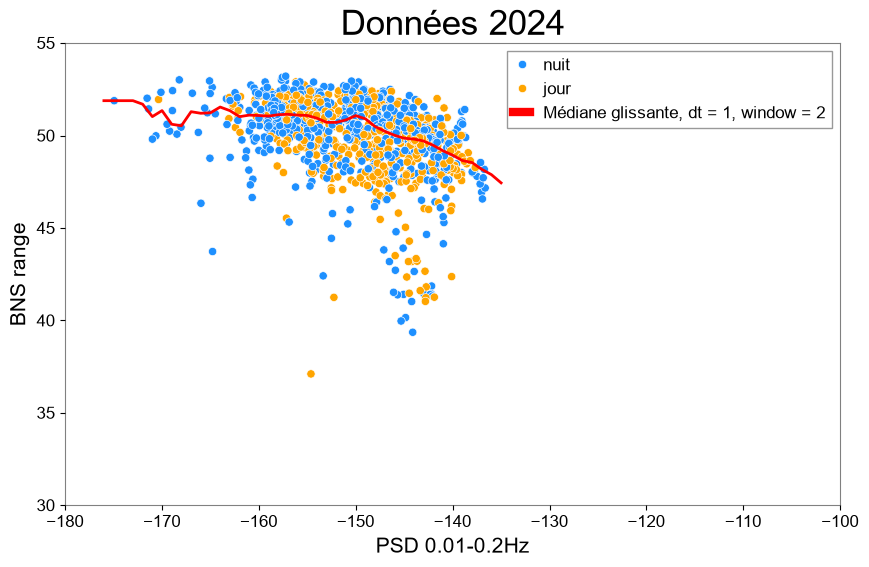

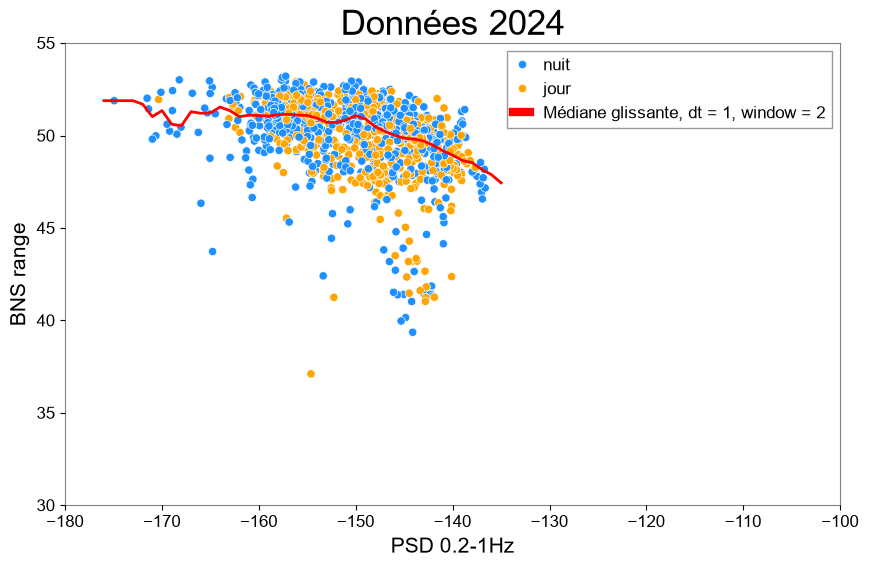

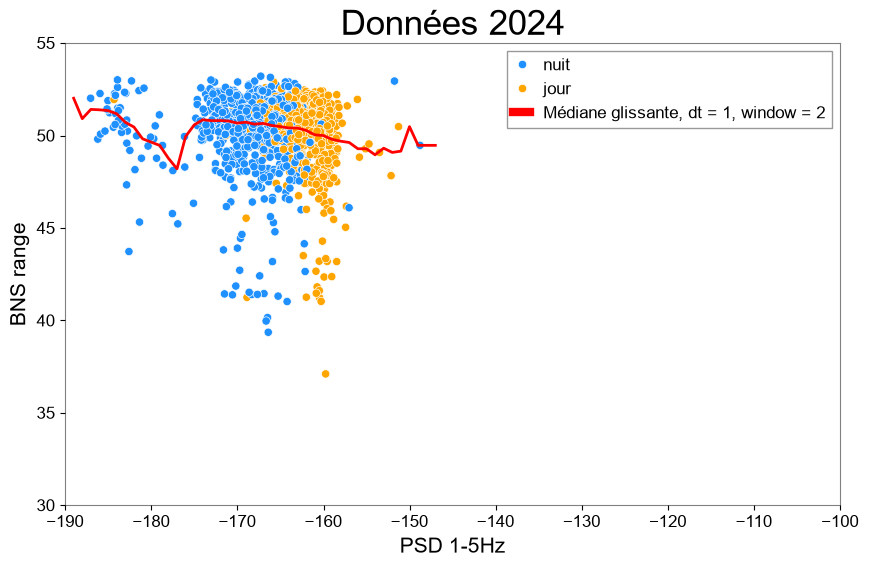

In [60]:
fct.plot_bns_param(df_clean4, 'BNS range','PSD 0.01-0.2Hz',xlim=(-180,-100),ylim=(30,55),dt=1, window = 2,title="Données 2024",outfile="BNS_O4_00102.png")
fct.plot_bns_param(df_clean4,'BNS range', 'PSD 0.2-1Hz',xlim=(-180,-100),ylim=(30,55),dt=1, window = 2,title="Données 2024",outfile="BNS_O4_021.png")
fct.plot_bns_param(df_clean4, 'BNS range','PSD 1-5Hz',xlim=(-190,-100),ylim=(30,55),dt=1,window = 2,title="Données 2024",outfile="BNS_O4_15.png")

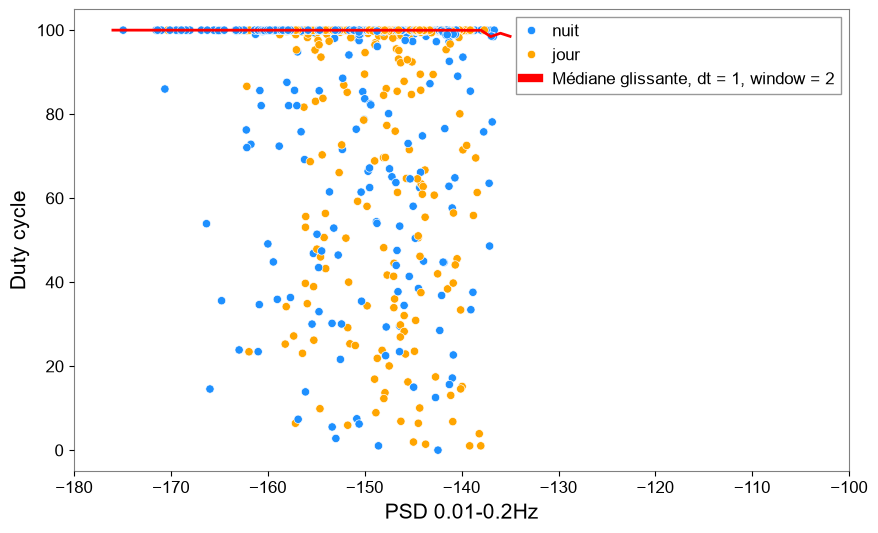

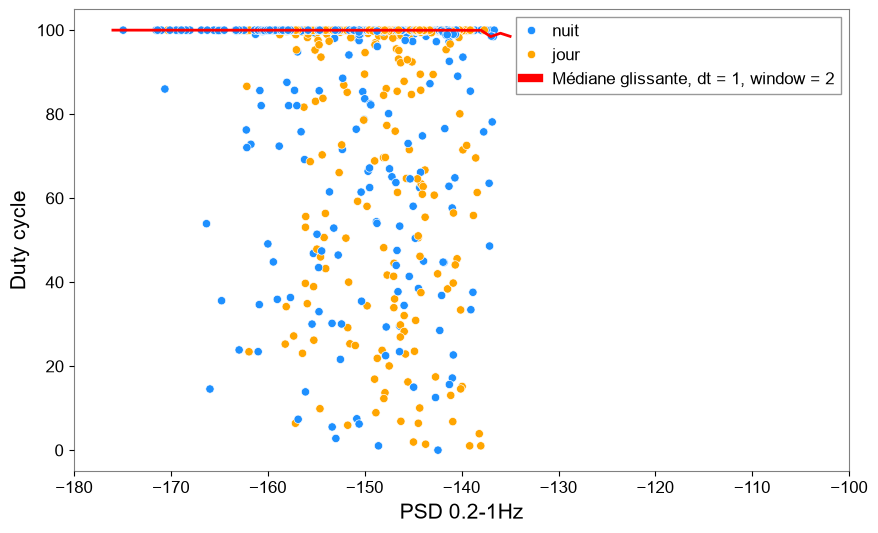

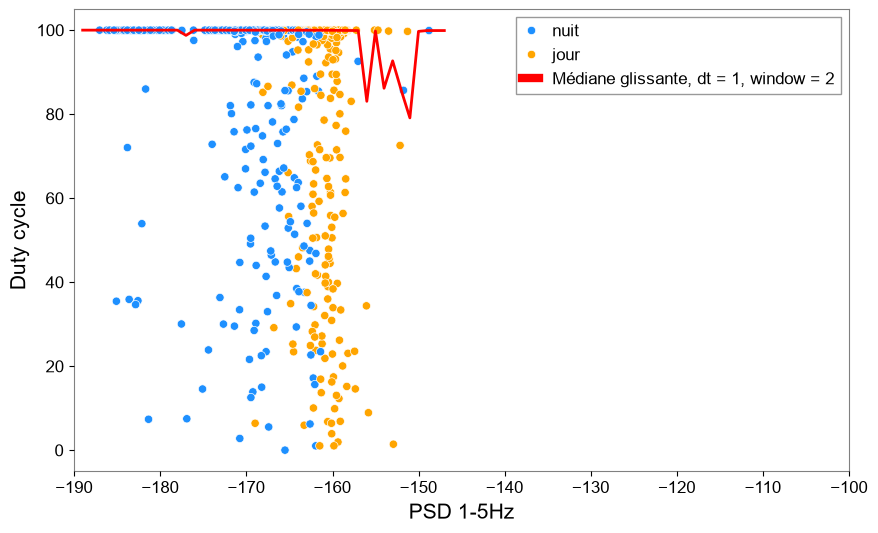

In [61]:
fct.plot_bns_param(df_clean4, 'Duty cycle','PSD 0.01-0.2Hz',xlim=(-180,-100),dt=1, window = 2)
fct.plot_bns_param(df_clean4,'Duty cycle', 'PSD 0.2-1Hz',xlim=(-180,-100),dt=1, window = 2)
fct.plot_bns_param(df_clean4, 'Duty cycle','PSD 1-5Hz',xlim=(-190,-100),dt=1,window = 2)

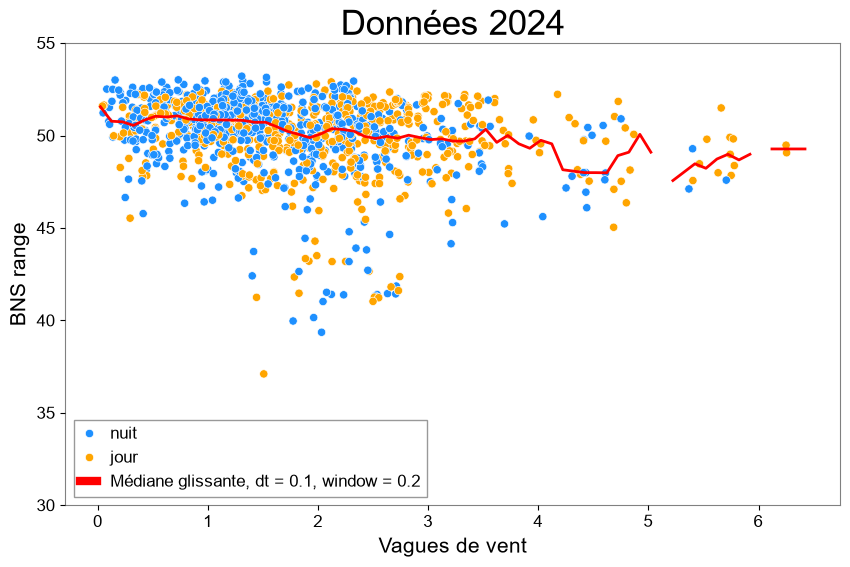

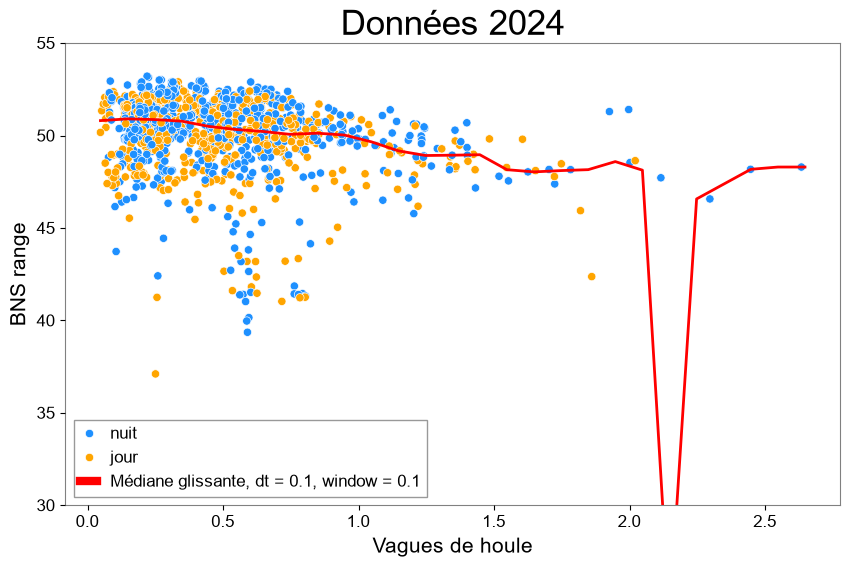

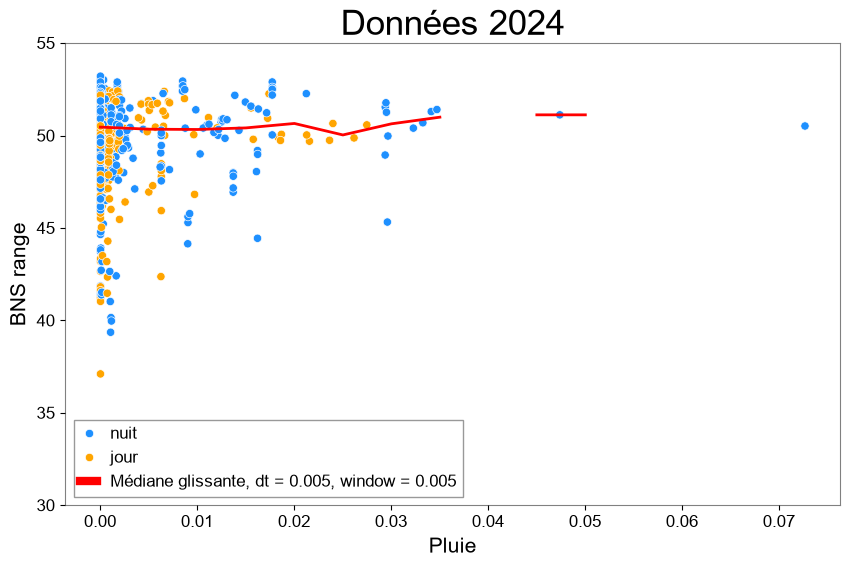

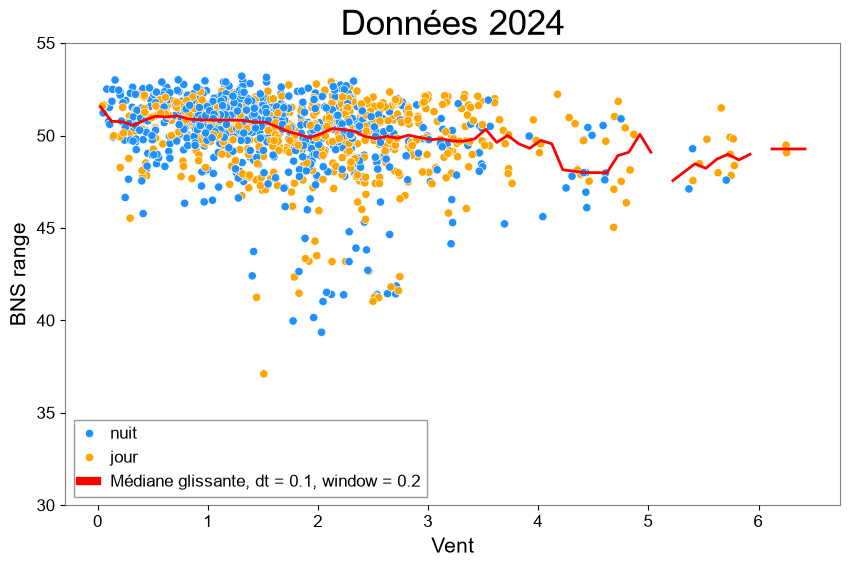

In [62]:
fct.plot_bns_param(df_clean4, 'BNS range','Vagues de vent',ylim=(30,55), dt = 0.1, window = 0.2,title="Données 2024",outfile="BNS_O4_ww.png")
fct.plot_bns_param(df_clean4, 'BNS range','Vagues de houle',ylim=(30,55),dt=0.1,window=0.1,title="Données 2024",outfile="BNS_O4_sw.png")
fct.plot_bns_param(df_clean4, 'BNS range','Pluie',ylim=(30,55),dt=0.005,window=0.005,title="Données 2024",outfile="BNS_O4_rain.png")
fct.plot_bns_param(df_clean4, 'BNS range','Vent',ylim=(30,55),dt=0.1,window=0.2,title="Données 2024",outfile="BNS_O4_wind.png")

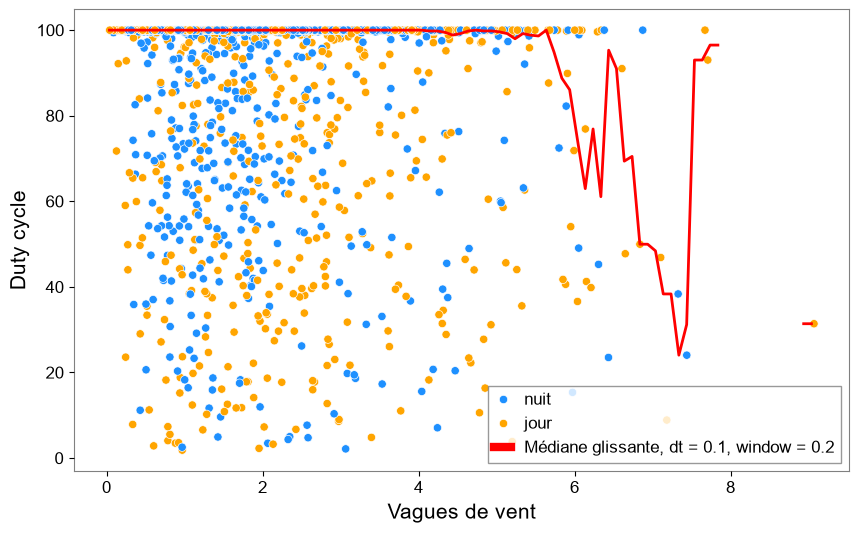

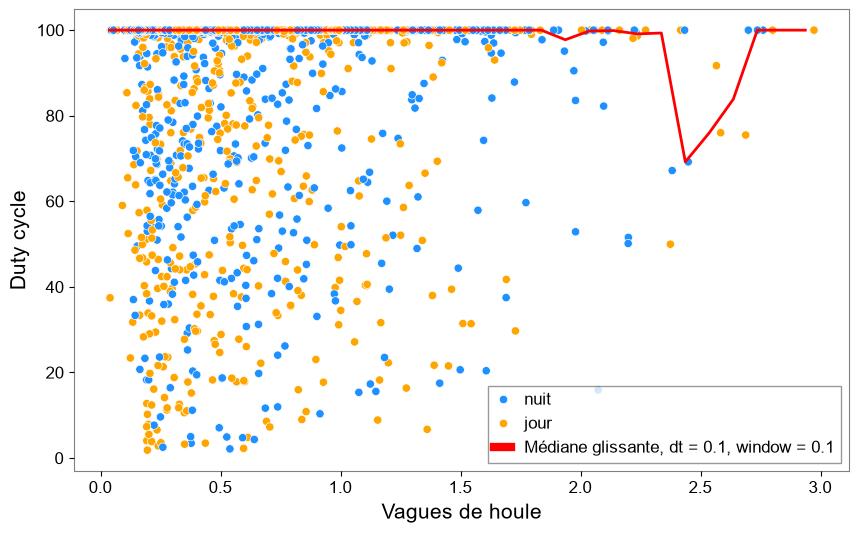

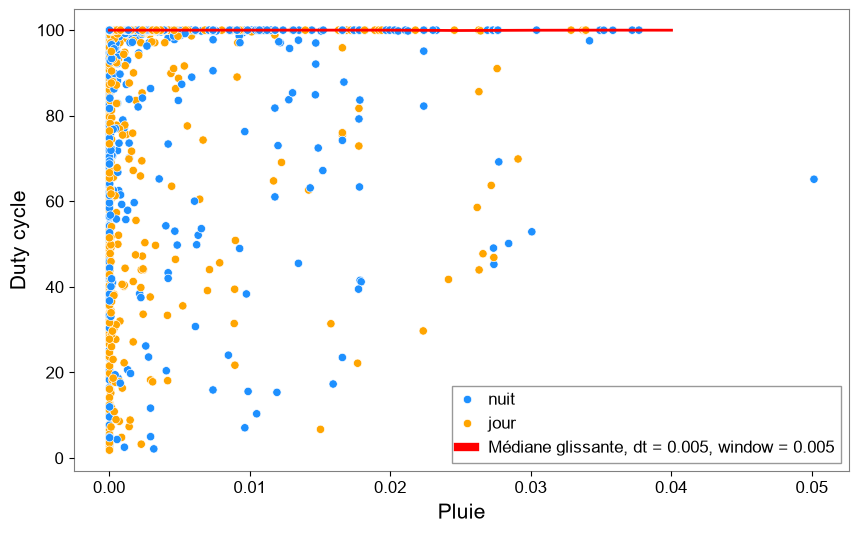

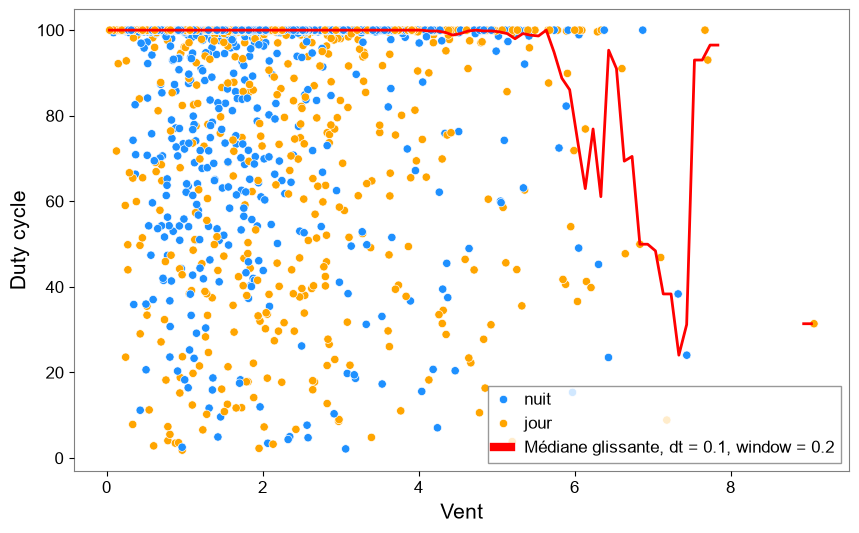

In [63]:
fct.plot_bns_param(df_clean, 'Duty cycle','Vagues de vent', dt = 0.1, window = 0.2)
fct.plot_bns_param(df_clean, 'Duty cycle','Vagues de houle',dt=0.1,window=0.1)
fct.plot_bns_param(df_clean, 'Duty cycle','Pluie',dt=0.005,window=0.005)
fct.plot_bns_param(df_clean, 'Duty cycle','Vent',dt=0.1,window=0.2)

# STRAIN

## 4 au 6 juillet 2024

In [64]:
psd,dates,freqs=fct.load_psd_strain("psd_strain_1404143286_2j.npz")

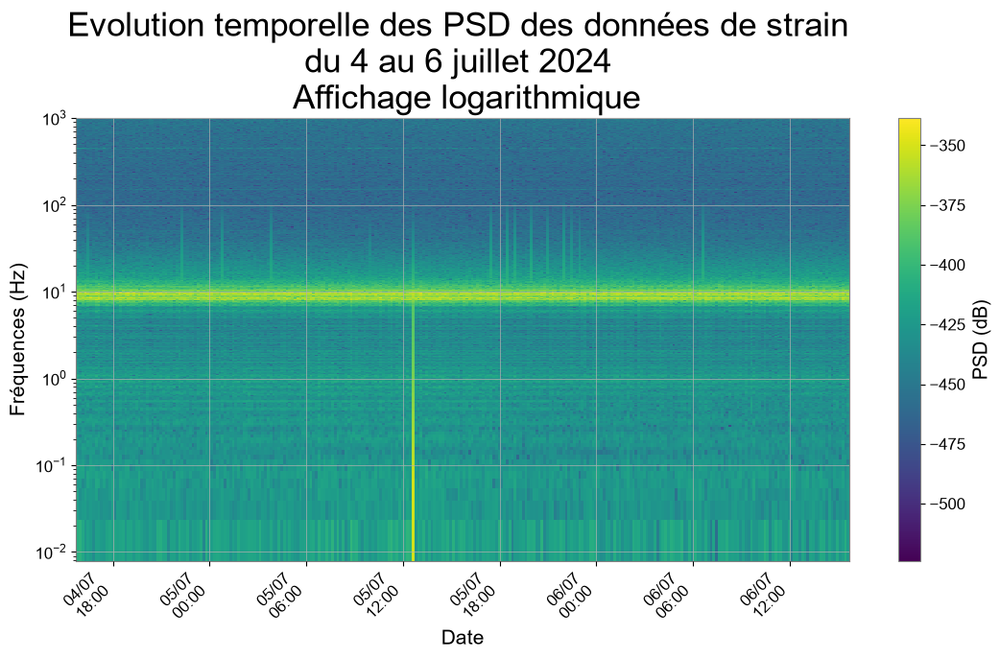

In [65]:
fct.spec_plot_strain(
    psd,
    dates,
    freqs,title="Evolution temporelle des PSD des données de strain \ndu 4 au 6 juillet 2024 \n Affichage logarithmique",outfile="spec_strain_ete.png"
)

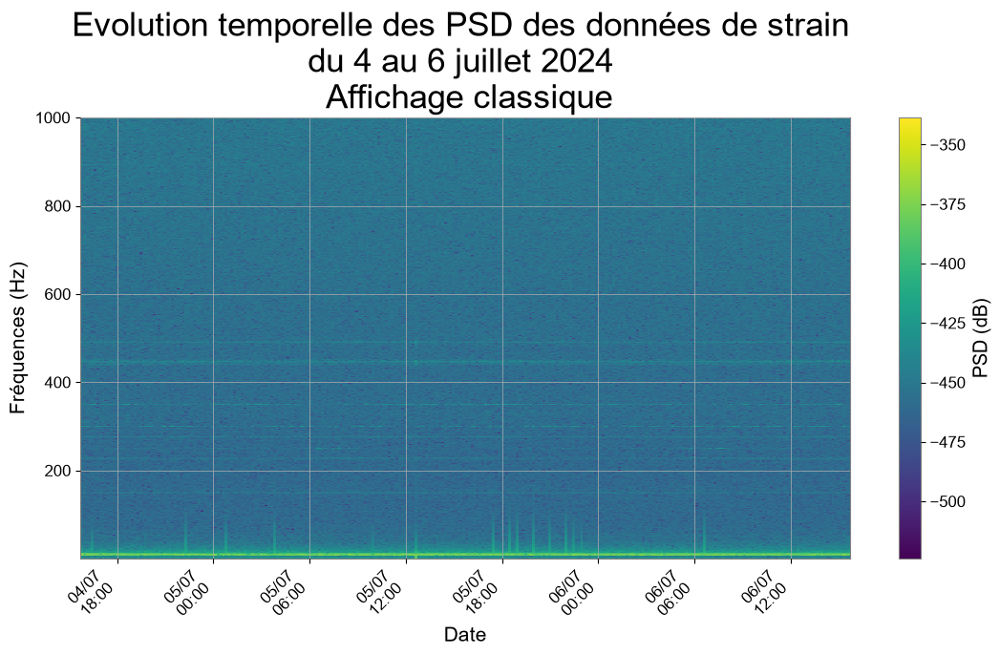

In [66]:
fct.spec_plot_strain(
    psd,
    dates,
    freqs,title="Evolution temporelle des PSD des données de strain \ndu 4 au 6 juillet 2024 \n Affichage classique",log=False,outfile="spec_strain_ete.png"
)

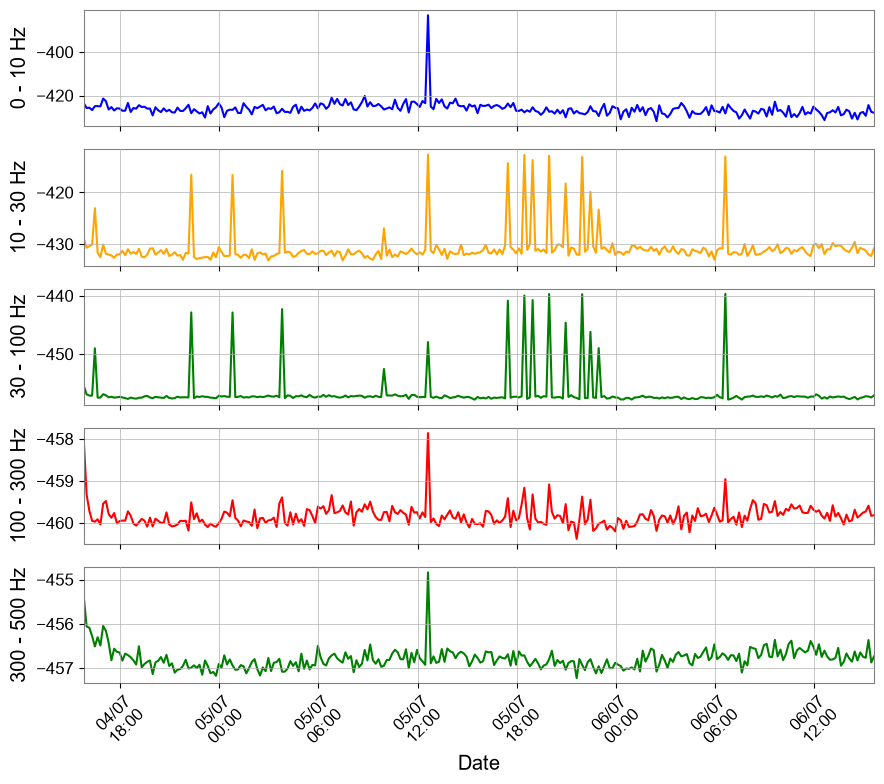

In [67]:
fct.median_4_strain(psd, dates, freqs,limx=None, we=False, eq = False, p=80 ,n=5,outfile="median_strain_ete.png")

## 13 au 15 décembre 2024

In [68]:
psd_d,dates_d,freqs_d=fct.load_psd_strain("psd_strain_1418140086_2j.npz")

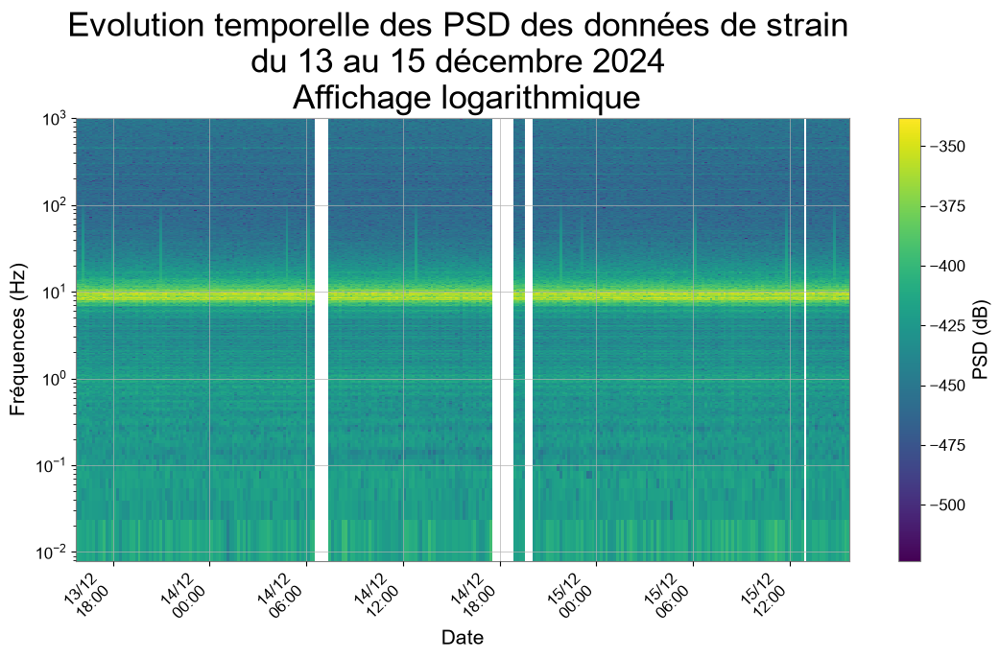

In [69]:
fct.spec_plot_strain(
    psd_d,
    dates_d,
    freqs_d,title="Evolution temporelle des PSD des données de strain \ndu 13 au 15 décembre 2024 \n Affichage logarithmique", log = True,outfile="spec_strain_hiver.png"
)

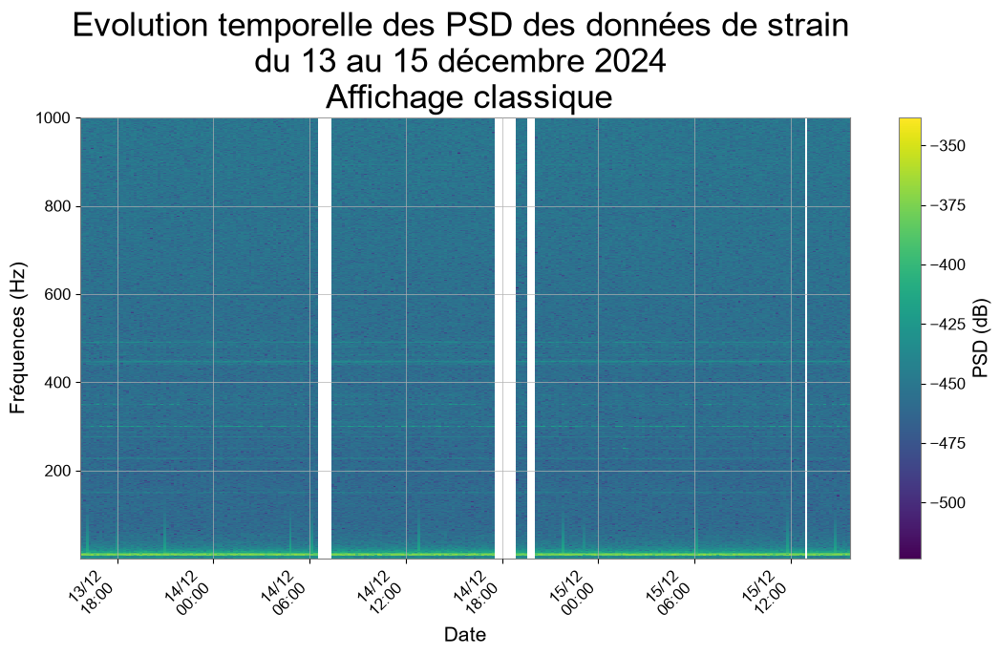

In [70]:
fct.spec_plot_strain(
    psd_d,
    dates_d,
    freqs_d,title="Evolution temporelle des PSD des données de strain \ndu 13 au 15 décembre 2024 \n Affichage classique", log = False,outfile="spec_strain_hiver.png"
)

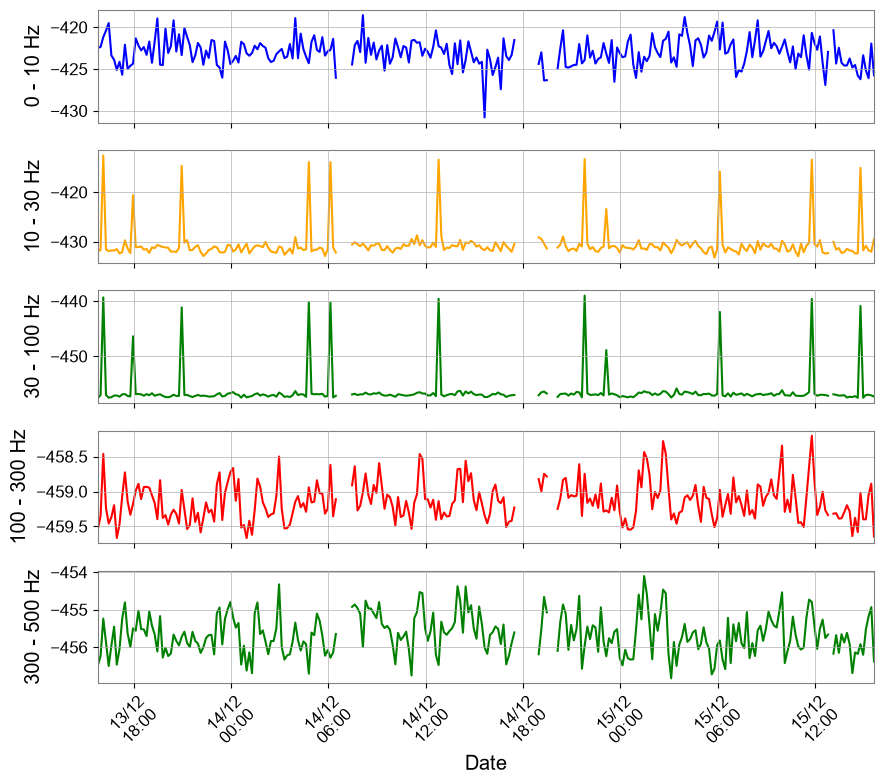

In [71]:
fct.median_4_strain(psd_d, dates_d, freqs_d,limx=None, we=False, eq = False, p=80 ,n=5,outfile="median_strain_hiver.png")